In [ ]:
import os
import random
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from collections import defaultdict
from sklearn.model_selection import train_test_split

# Download dataset
import kagglehub
path = kagglehub.dataset_download("gpiosenka/moths-image-datasetclassification")
print("Dataset path:", path)

# Combine images from train, valid, and test into one list
dataset_dir = Path(path)
image_paths = list(dataset_dir.glob("train/*/*.jpg")) + \
              list(dataset_dir.glob("valid/*/*.jpg")) + \
              list(dataset_dir.glob("test/*/*.jpg"))

labels = [img_path.parent.name for img_path in image_paths]



100%|██████████| 295M/295M [00:03<00:00, 83.2MB/s]

Extracting files...


Dataset path: /root/.cache/kagglehub/datasets/gpiosenka/moths-image-datasetclassification/versions/1


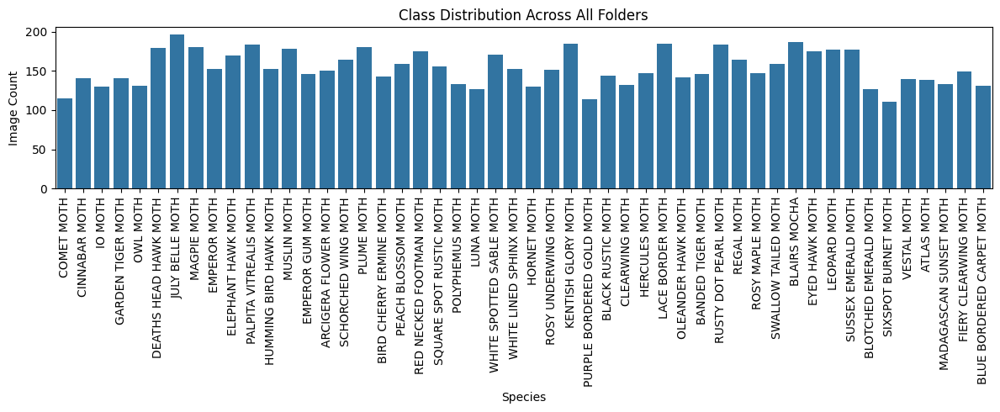

In [ ]:
# Class count
class_counts = defaultdict(int)
for label in labels:
    class_counts[label] += 1

# Plot class distribution
plt.figure(figsize=(12, 5))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()))
plt.xticks(rotation=90)
plt.title("Class Distribution Across All Folders")
plt.ylabel("Image Count")
plt.xlabel("Species")
plt.tight_layout()
plt.show()


In [ ]:
# Perform stratified train/val/test split
label_to_paths = defaultdict(list)
for img_path in image_paths:
    label = img_path.parent.name
    label_to_paths[label].append(img_path)

train_set, val_set, test_set = [], [], []

for label, paths in label_to_paths.items():
    if len(paths) >= 3:
        temp_train, temp_test = train_test_split(paths, test_size=0.2, random_state=42)
        temp_train, temp_val = train_test_split(temp_train, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2
    else:
        temp_train, temp_val, temp_test = paths[:1], paths[1:2], paths[2:3]
    train_set += [(p, label) for p in temp_train]
    val_set += [(p, label) for p in temp_val]
    test_set += [(p, label) for p in temp_test]

print(f"Train: {len(train_set)} images")
print(f"Validation: {len(val_set)} images")
print(f"Test: {len(test_set)} images")


Train: 4582 images
Validation: 1545 images
Test: 1556 images


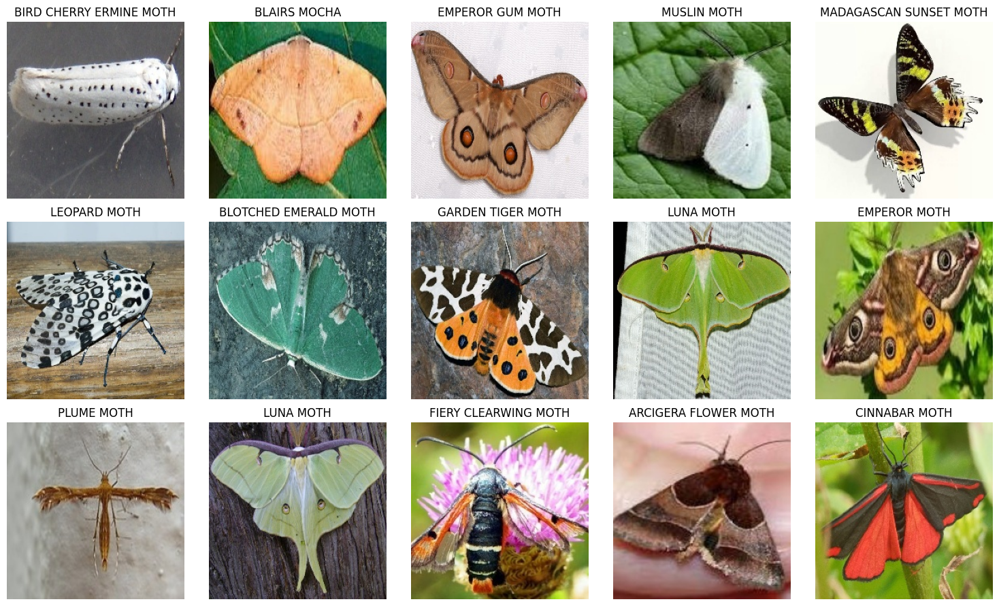

In [ ]:
# Display a sample of combined images
fig, axes = plt.subplots(3, 5, figsize=(15, 9))
for ax in axes.flatten():
    img_path, label = random.choice(train_set + val_set + test_set)
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')
plt.tight_layout()
plt.show()


### ✅ Updated Dataset Handling

- Combined original train/valid/test images into one unified pool.
- Verified image labels and class balance.
- Performed **stratified train/validation/test split**.
- Ready to save splits or feed into model pipelines.


In [ ]:
import shutil

# Define destination folder
split_root = Path("split_data")
split_root.mkdir(exist_ok=True)


# Save files into 'split_data/train', 'split_data/val', 'split_data/test'
splits = {
    "train": train_set,
    "val": val_set,
    "test": test_set,
}

for split_name, data_list in splits.items():
    for img_path, label in data_list:
        dest_dir = split_root / split_name / label
        dest_dir.mkdir(parents=True, exist_ok=True)
        dest_path = dest_dir / img_path.name
        shutil.copy(img_path, dest_path)

print("Split saved to:", split_root.resolve())


Split saved to: /content/split_data


Unique formats: {'JPEG'}
Channel counts (e.g. 3=RGB): {3}
Total corrupt images: 0


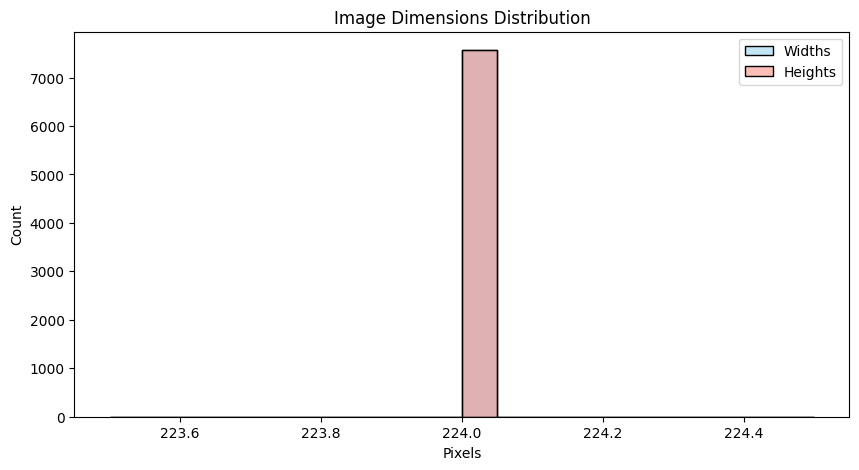

In [ ]:
# Image diagnostics for resolution, format, channel count

formats = []
channels = []
sizes = []
corrupt_files = []

for img_path in split_root.rglob("*.jpg"):
    try:
        with Image.open(img_path) as img:
            formats.append(img.format)
            channels.append(len(img.getbands()))
            sizes.append(img.size)
    except Exception as e:
        print(f"Corrupt image: {img_path} — {e}")
        corrupt_files.append(img_path)

# Report summary
print("Unique formats:", set(formats))
print("Channel counts (e.g. 3=RGB):", set(channels))
print(f"Total corrupt images: {len(corrupt_files)}")

# Plot width/height distribution

w, h = zip(*sizes)
plt.figure(figsize=(10, 5))
sns.histplot(w, bins=20, kde=True, color='skyblue', label='Widths')
sns.histplot(h, bins=20, kde=True, color='salmon', label='Heights')
plt.title("Image Dimensions Distribution")
plt.xlabel("Pixels")
plt.legend()
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory

BATCH_SIZE = 32
IMG_SIZE = (224, 224)

train_ds = image_dataset_from_directory(
    "split_data/train",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical'  # use 'int' if you prefer integer labels
)

val_ds = image_dataset_from_directory(
    "split_data/val",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical'
)

test_ds = image_dataset_from_directory(
    "split_data/test",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False  # Keep order for evaluation
)


Found 4495 files belonging to 50 classes.
Found 1533 files belonging to 50 classes.
Found 1540 files belonging to 50 classes.


Classes: ['ARCIGERA FLOWER MOTH', 'ATLAS MOTH', 'BANDED TIGER MOTH', 'BIRD CHERRY ERMINE MOTH', 'BLACK RUSTIC MOTH', 'BLAIRS MOCHA', 'BLOTCHED EMERALD MOTH', 'BLUE BORDERED CARPET MOTH', 'CINNABAR MOTH', 'CLEARWING MOTH', 'COMET MOTH', 'DEATHS HEAD HAWK MOTH', 'ELEPHANT HAWK MOTH', 'EMPEROR GUM MOTH', 'EMPEROR MOTH', 'EYED HAWK MOTH', 'FIERY CLEARWING MOTH', 'GARDEN TIGER MOTH', 'HERCULES MOTH', 'HORNET MOTH', 'HUMMING BIRD HAWK MOTH', 'IO MOTH', 'JULY BELLE MOTH', 'KENTISH GLORY MOTH', 'LACE BORDER MOTH', 'LEOPARD MOTH', 'LUNA MOTH', 'MADAGASCAN SUNSET MOTH', 'MAGPIE MOTH', 'MUSLIN MOTH', 'OLEANDER HAWK MOTH', 'OWL MOTH', 'PALPITA VITREALIS MOTH', 'PEACH BLOSSOM MOTH', 'PLUME MOTH', 'POLYPHEMUS MOTH', 'PURPLE BORDERED GOLD MOTH', 'RED NECKED FOOTMAN MOTH', 'REGAL MOTH', 'ROSY MAPLE MOTH', 'ROSY UNDERWING MOTH', 'RUSTY DOT PEARL MOTH', 'SCHORCHED WING MOTH', 'SIXSPOT BURNET MOTH', 'SQUARE SPOT RUSTIC MOTH', 'SUSSEX EMERALD MOTH', 'SWALLOW TAILED MOTH', 'VESTAL MOTH', 'WHITE LINED SPHIN

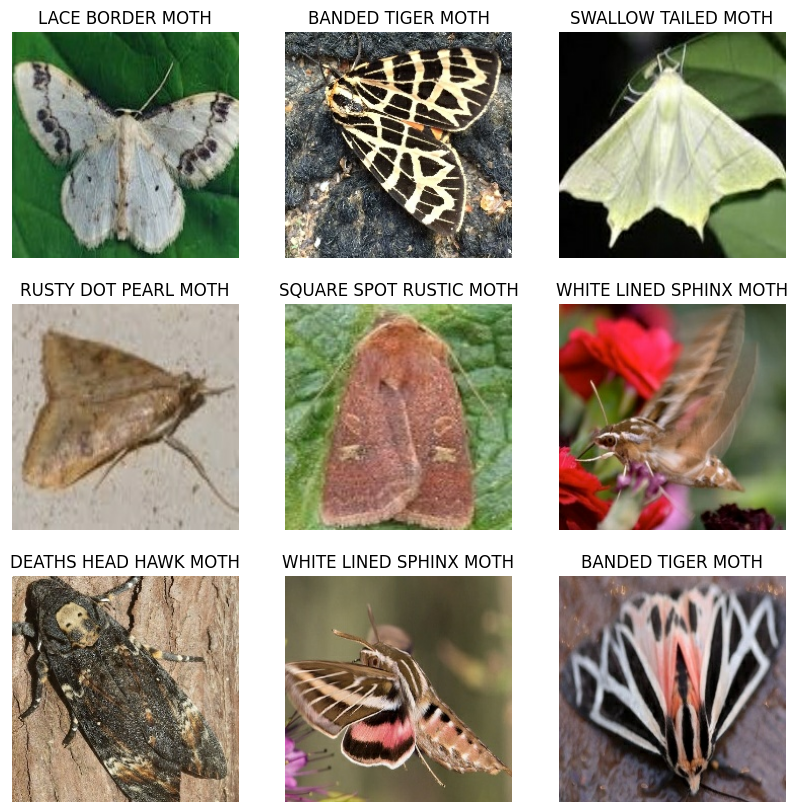

In [ ]:
class_names = train_ds.class_names
print("Classes:", class_names)


plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[tf.argmax(labels[i])])
        plt.axis("off")


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)


In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

base_model = MobileNetV2(input_shape=IMG_SIZE + (3,), include_top=False, weights='imagenet')
base_model.trainable = False  # Freeze weights initially

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(len(class_names), activation='softmax')
])

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │         6,450 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,428,402 (9.26 MB)

 Trainable params: 170,418 (665.70 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
EPOCHS = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,

    epochs=EPOCHS
)


Epoch 1/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 289s 2s/step - accuracy: 0.0511 - loss: 3.9118 - val_accuracy: 0.1644 - val_loss: 3.4168
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 292s 2s/step - accuracy: 0.1512 - loss: 3.2816 - val_accuracy: 0.2459 - val_loss: 2.9379
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 278s 2s/step - accuracy: 0.2371 - loss: 2.8804 - val_accuracy: 0.2785 - val_loss: 2.7473
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 315s 2s/step - accuracy: 0.2922 - loss: 2.5866 - val_accuracy: 0.3209 - val_loss: 2.5818
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 278s 2s/step - accuracy: 0.3323 - loss: 2.4299 - val_accuracy: 0.3190 - val_loss: 2.4942
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 315s 2s/step - accuracy: 0.3782 - loss: 2.2595 - val_accuracy: 0.3444 - val_loss: 2.4226
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 334s 2s/step - accuracy: 0.4099 - loss: 2.1460 - val_accuracy: 0.3705 - val_loss: 2.3379
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 255s 2s/step - accuracy: 0.4283 - loss: 2.0487 - val_accu

In [ ]:
loss, acc = model.evaluate(test_ds)
print(f"Test accuracy: {acc:.2f}")


49/49 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - accuracy: 0.4447 - loss: 2.0275
Test accuracy: 0.43


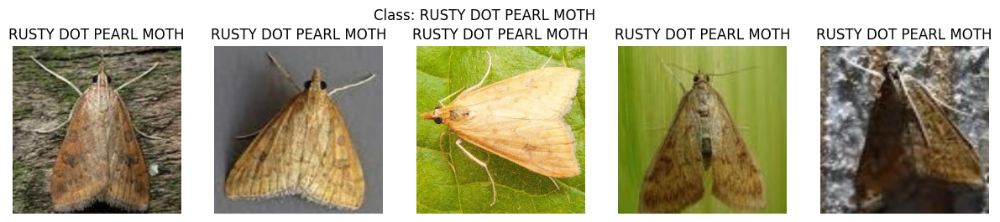

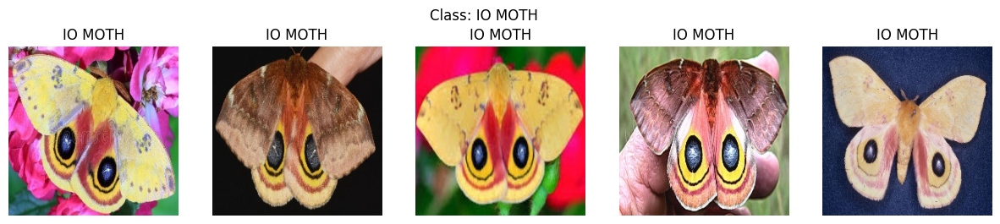

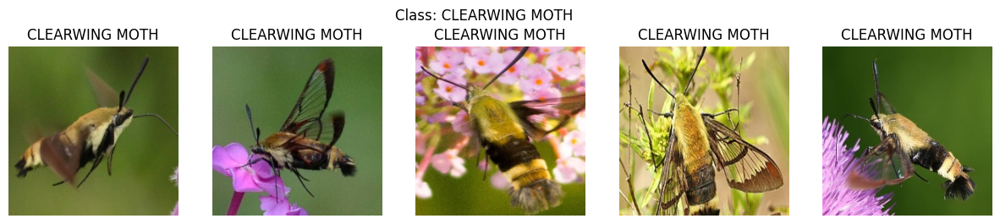

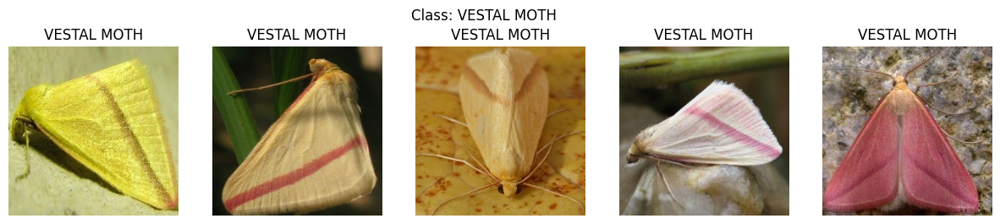

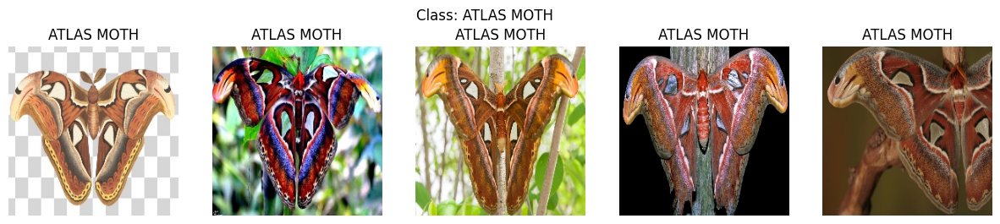

In [ ]:
root = Path("split_data/train")  # or val/test

# Randomly display N images per class
classes = [d.name for d in root.iterdir() if d.is_dir()]
for cls in random.sample(classes, 5):
    image_paths = list((root / cls).glob("*.jpg"))
    fig, axs = plt.subplots(1, 5, figsize=(15, 3))
    for i, img_path in enumerate(random.sample(image_paths, 5)):
        img = Image.open(img_path)
        axs[i].imshow(img)
        axs[i].set_title(cls)
        axs[i].axis("off")
    plt.suptitle(f"Class: {cls}")
    plt.show()


In [ ]:
import hashlib

def hash_image(img_path):
    with Image.open(img_path) as img:
        return hashlib.md5(img.tobytes()).hexdigest()

hash_dict = {}
duplicates = []

for img_path in Path("split_data").rglob("*.jpg"):
    h = hash_image(img_path)
    if h in hash_dict:
        duplicates.append((img_path, hash_dict[h]))
    else:
        hash_dict[h] = img_path

print(f"Found {len(duplicates)} duplicates.")
for dup1, dup2 in duplicates[:5]:
    print("DUPLICATE:", dup1, "<-->", dup2)


Found 0 duplicates.


In [ ]:
# Reload test dataset only to access class names
test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
    "split_data/test",
    image_size=(224, 224),
    shuffle=False  # Important to preserve label order if reusing predictions
)

class_names = test_ds_raw.class_names

Found 1540 files belonging to 50 classes.


In [ ]:
import numpy as np

y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

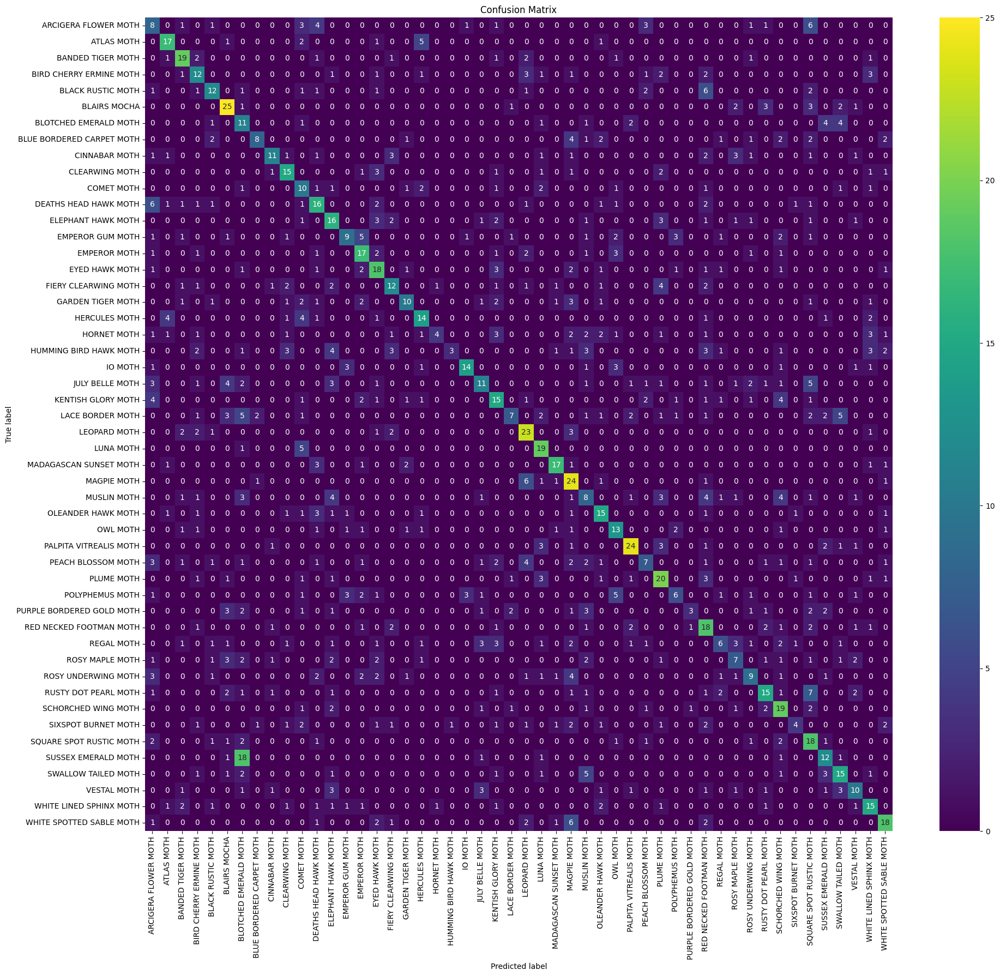

In [ ]:
import pandas as pd
from sklearn.metrics import confusion_matrix

# Create confusion matrix as DataFrame for seaborn heatmap
cm = confusion_matrix(y_true, y_pred)
cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

plt.figure(figsize=(20, 18))  # Bigger canvas
sns.heatmap(cm_df, annot=True, fmt='d', cmap='viridis', cbar=True)

plt.title("Confusion Matrix")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [ ]:
# Find most confused class pairs (off-diagonal max values)
top_confused = []
for i in range(len(class_names)):
    for j in range(len(class_names)):
        if i != j:
            top_confused.append((cm[i][j], class_names[i], class_names[j]))

top_confused.sort(reverse=True)
for count, true_cls, pred_cls in top_confused[:10]:
    print(f"{true_cls} → {pred_cls}: {count} times")



SUSSEX EMERALD MOTH → BLOTCHED EMERALD MOTH: 18 times
RUSTY DOT PEARL MOTH → SQUARE SPOT RUSTIC MOTH: 7 times
WHITE SPOTTED SABLE MOTH → MAGPIE MOTH: 6 times
MAGPIE MOTH → LEOPARD MOTH: 6 times
DEATHS HEAD HAWK MOTH → ARCIGERA FLOWER MOTH: 6 times
BLACK RUSTIC MOTH → RED NECKED FOOTMAN MOTH: 6 times
ARCIGERA FLOWER MOTH → SQUARE SPOT RUSTIC MOTH: 6 times
SWALLOW TAILED MOTH → MUSLIN MOTH: 5 times
POLYPHEMUS MOTH → OWL MOTH: 5 times
LUNA MOTH → COMET MOTH: 5 times


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_true, y_pred, target_names=class_names))


                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       0.20      0.27      0.23        30
               ATLAS MOTH       0.61      0.63      0.62        27
        BANDED TIGER MOTH       0.56      0.63      0.59        30
  BIRD CHERRY ERMINE MOTH       0.38      0.41      0.39        29
        BLACK RUSTIC MOTH       0.48      0.41      0.44        29
             BLAIRS MOCHA       0.53      0.66      0.59        38
    BLOTCHED EMERALD MOTH       0.20      0.44      0.27        25
BLUE BORDERED CARPET MOTH       0.67      0.31      0.42        26
            CINNABAR MOTH       0.61      0.39      0.48        28
           CLEARWING MOTH       0.52      0.56      0.54        27
               COMET MOTH       0.26      0.43      0.32        23
    DEATHS HEAD HAWK MOTH       0.39      0.44      0.42        36
       ELEPHANT HAWK MOTH       0.36      0.47      0.41        34
         EMPEROR GUM MOTH       0.50      0.30      0.38     

In [ ]:
confusion_pairs_df = pd.DataFrame([
    {"True Class": true_cls, "Predicted Class": pred_cls, "Confusions": count}
    for count, true_cls, pred_cls in top_confused if count > 0
])
confusion_pairs_df.head(10)


,True Class,Predicted Class,Confusions
0,SUSSEX EMERALD MOTH,BLOTCHED EMERALD MOTH,18
1,RUSTY DOT PEARL MOTH,SQUARE SPOT RUSTIC MOTH,7
2,WHITE SPOTTED SABLE MOTH,MAGPIE MOTH,6
3,MAGPIE MOTH,LEOPARD MOTH,6
4,DEATHS HEAD HAWK MOTH,ARCIGERA FLOWER MOTH,6
5,BLACK RUSTIC MOTH,RED NECKED FOOTMAN MOTH,6
6,ARCIGERA FLOWER MOTH,SQUARE SPOT RUSTIC MOTH,6
7,SWALLOW TAILED MOTH,MUSLIN MOTH,5
8,POLYPHEMUS MOTH,OWL MOTH,5
9,LUNA MOTH,COMET MOTH,5


In [ ]:
# Re-load test dataset for labels and class names
test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
    "split_data/test",
    image_size=(224, 224),
    batch_size=32,
    label_mode='categorical',
    shuffle=False
)
class_names = test_ds_raw.class_names

AUTOTUNE = tf.data.AUTOTUNE
test_ds = test_ds_raw.prefetch(buffer_size=AUTOTUNE)

# Extract features using pre-trained model backbone
feature_extractor = tf.keras.Model(inputs=base_model.input, outputs=base_model.output)

features = []
labels = []

for images, lbls in test_ds:
    feats = feature_extractor.predict(images)
    features.append(feats)
    labels.extend(np.argmax(lbls.numpy(), axis=1))

features = np.concatenate(features, axis=0)
labels = np.array(labels)

Found 1540 files belonging to 50 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━

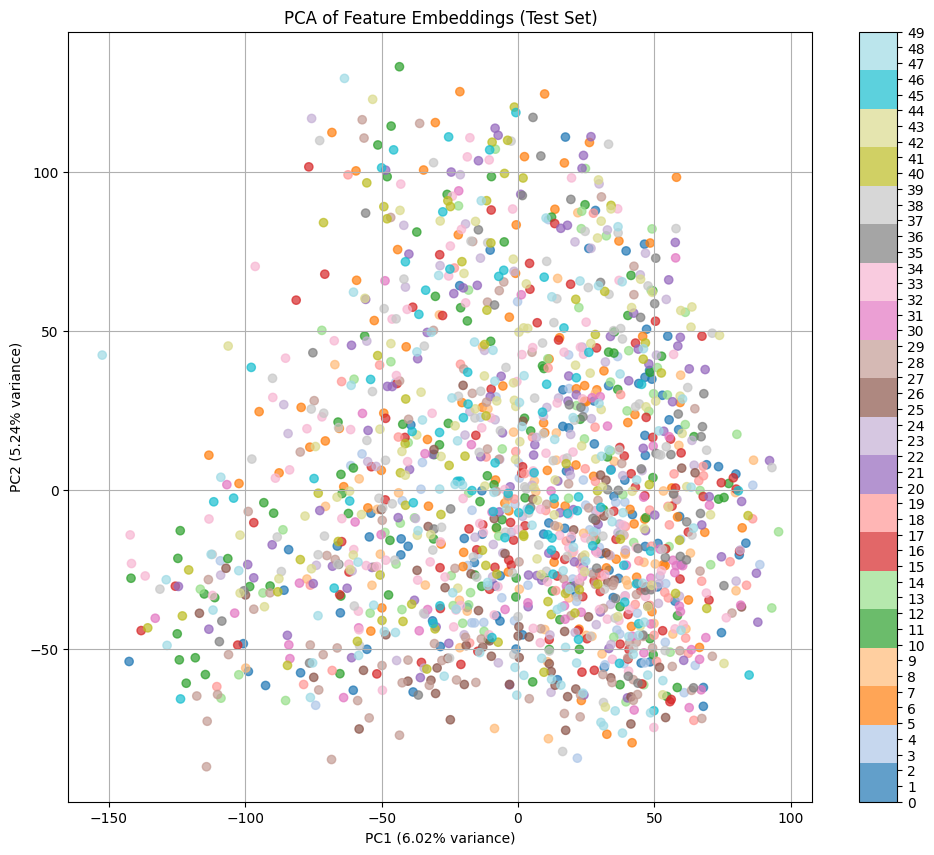

In [ ]:
from sklearn.decomposition import PCA

# Reshape features: (N, H, W, C) → (N, H*W*C)
features_flat = features.reshape(features.shape[0], -1)

# Apply PCA
pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_flat)

# Plot
plt.figure(figsize=(12, 10))
scatter = plt.scatter(features_pca[:, 0], features_pca[:, 1], c=labels, cmap='tab20', alpha=0.7)
plt.colorbar(scatter, ticks=range(len(class_names)))
plt.title("PCA of Feature Embeddings (Test Set)")
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.2f}% variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.2f}% variance)")
plt.grid(True)
plt.show()


In [ ]:
!pip install umap-learn

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


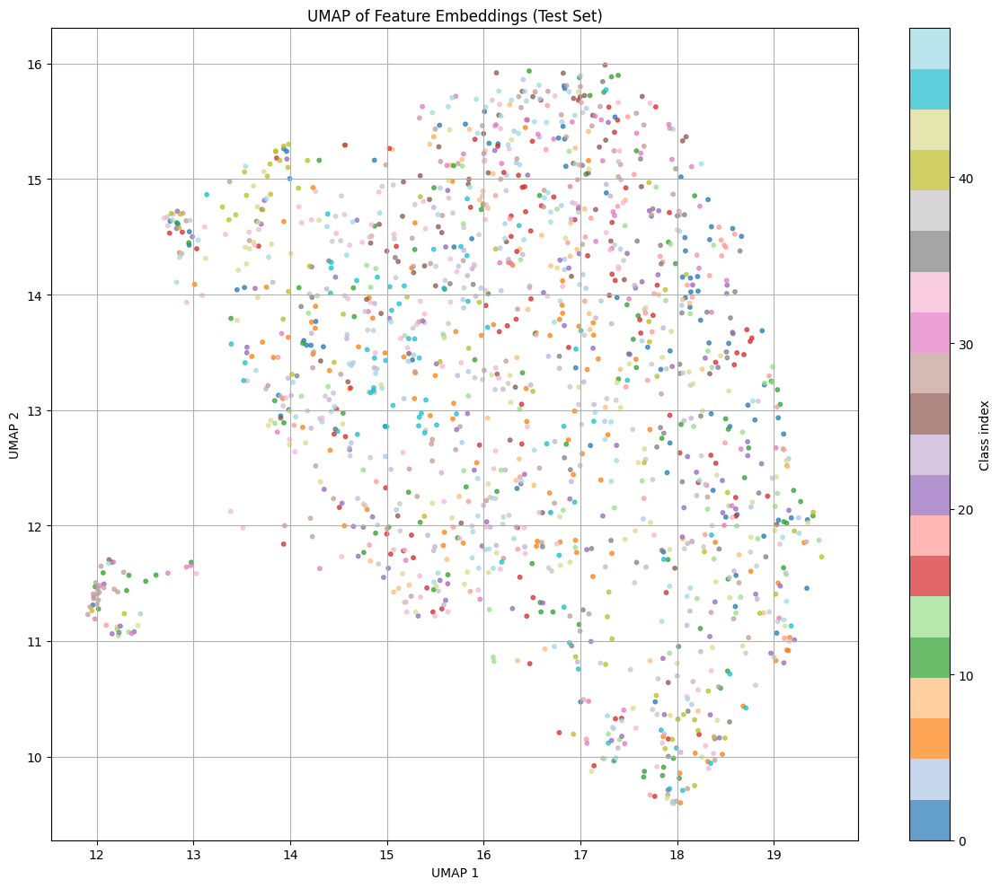

In [ ]:
import umap

# Flatten 4D feature maps to 2D: (N, H, W, C) -> (N, H*W*C)
features = features.reshape(features.shape[0], -1)

# Reduce features to 2D using UMAP
reducer = umap.UMAP(n_components=2, random_state=42)
features_umap = reducer.fit_transform(features)

# Plot
plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    features_umap[:, 0],
    features_umap[:, 1],
    c=labels,
    cmap='tab20',
    s=10,
    alpha=0.7
)
plt.title('UMAP of Feature Embeddings (Test Set)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.colorbar(scatter, label='Class index')
plt.grid(True)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


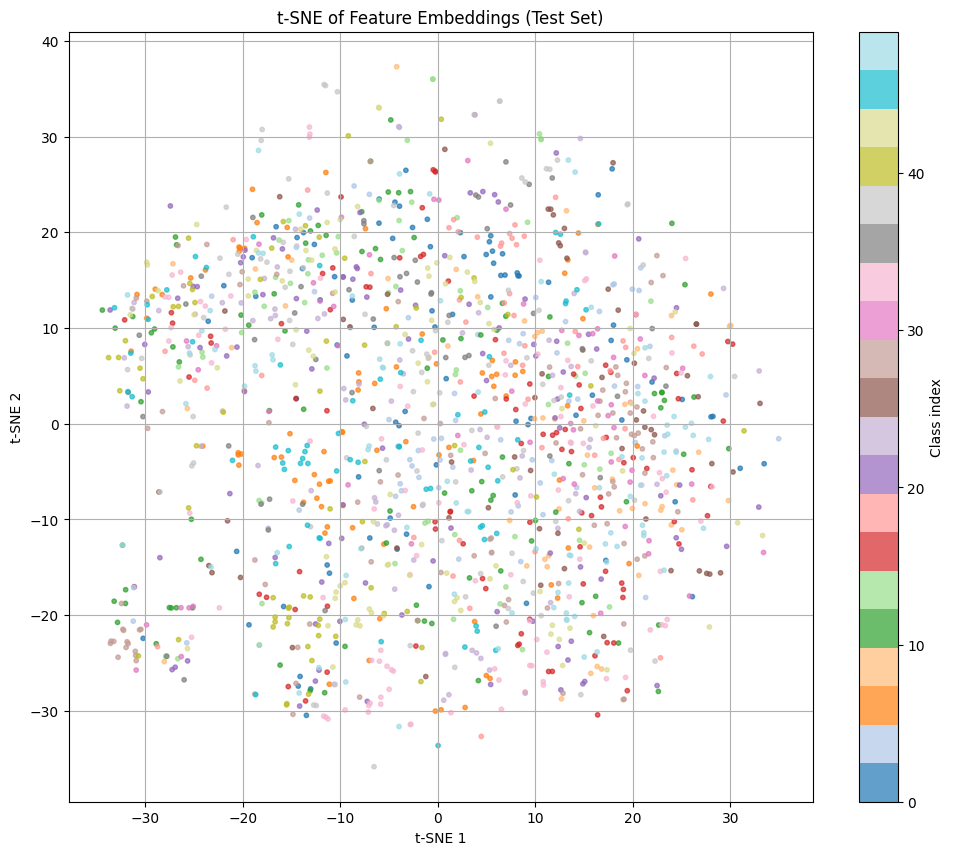

In [ ]:
from sklearn.manifold import TSNE

# Reduce dimensionality
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=42)
features_tsne = tsne.fit_transform(features)

# Plot
plt.figure(figsize=(12, 10))
scatter = plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=labels, cmap='tab20', s=10, alpha=0.7)
plt.colorbar(scatter, label='Class index')
plt.title("t-SNE of Feature Embeddings (Test Set)")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid(True)
plt.show()


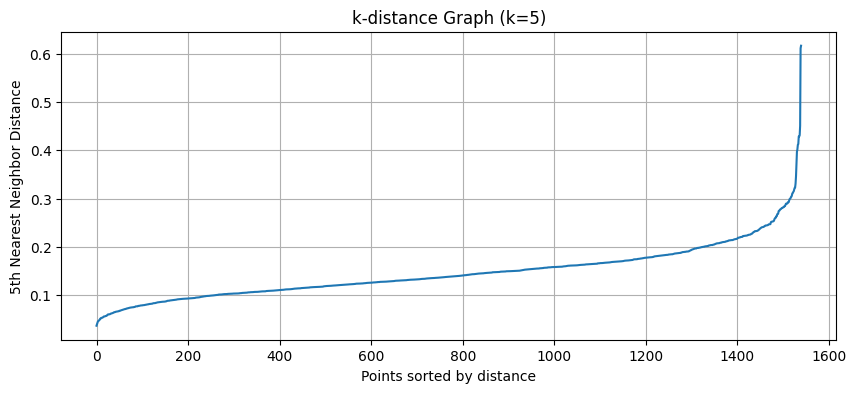

In [ ]:
from sklearn.neighbors import NearestNeighbors

k = 5
nn = NearestNeighbors(n_neighbors=k)
nn.fit(features_umap)
distances, _ = nn.kneighbors(features_umap)
distances = np.sort(distances[:, k - 1])

plt.figure(figsize=(10, 4))
plt.plot(distances)
plt.title(f"k-distance Graph (k={k})")
plt.xlabel("Points sorted by distance")
plt.ylabel(f"{k}th Nearest Neighbor Distance")
plt.grid(True)
plt.show()


In [ ]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.2, min_samples=5)
dbscan_labels = dbscan.fit_predict(features_umap)

# Optional: print unique labels
print("DBSCAN clusters found:", np.unique(dbscan_labels))


DBSCAN clusters found: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12]


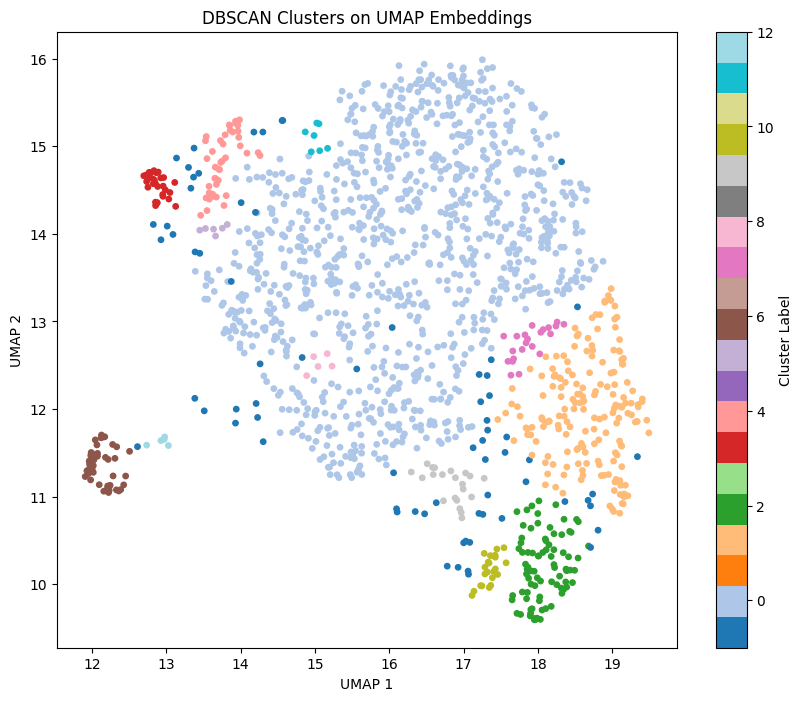

In [ ]:
plt.figure(figsize=(10, 8))
scatter = plt.scatter(features_umap[:, 0], features_umap[:, 1], c=dbscan_labels, cmap='tab20', s=15)
plt.colorbar(scatter, label="Cluster Label")
plt.title("DBSCAN Clusters on UMAP Embeddings")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.show()


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Silhouette Score: 0.368
Davies-Bouldin Score: 0.849
Calinski-Harabasz Score: 1558.6


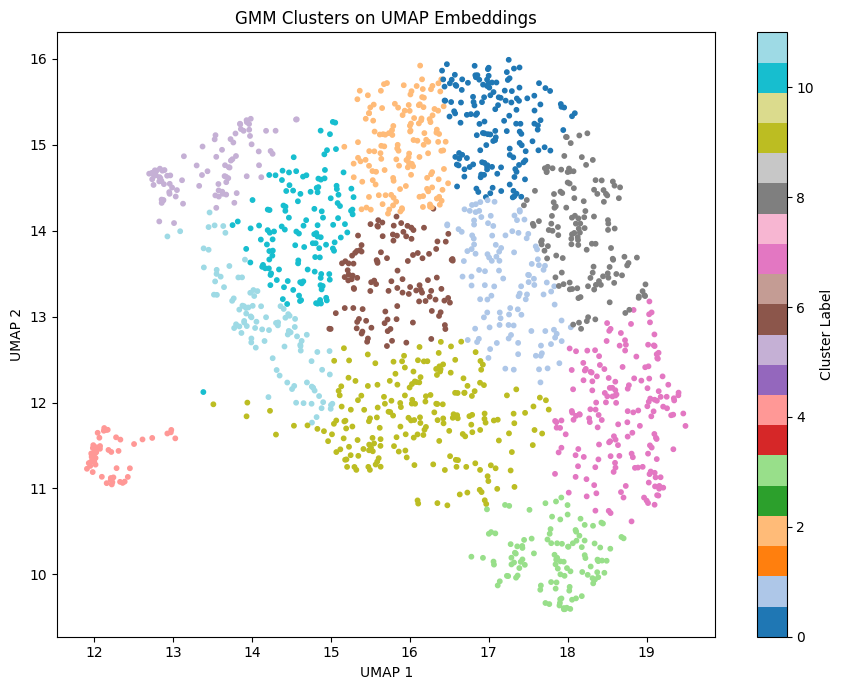

In [ ]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Step 1: UMAP Projection
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
features_umap = umap_model.fit_transform(features)

# Step 2: GMM Clustering
gmm = GaussianMixture(n_components=12, covariance_type='full', random_state=42)
gmm_labels = gmm.fit_predict(features_umap)

# Step 3: Evaluation
silhouette = silhouette_score(features_umap, gmm_labels)
davies_bouldin = davies_bouldin_score(features_umap, gmm_labels)
calinski_harabasz = calinski_harabasz_score(features_umap, gmm_labels)

print(f"Silhouette Score: {silhouette:.3f}")
print(f"Davies-Bouldin Score: {davies_bouldin:.3f}")
print(f"Calinski-Harabasz Score: {calinski_harabasz:.1f}")

# Step 4: Visualise
plt.figure(figsize=(9, 7))
scatter = plt.scatter(features_umap[:, 0], features_umap[:, 1], c=gmm_labels, cmap='tab20', s=10)
plt.title("GMM Clusters on UMAP Embeddings")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.colorbar(scatter, label="Cluster Label")
plt.tight_layout()
plt.show()


In [ ]:
# Load datasets again if needed, or access the original train_ds before prefetching
train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
    "split_data/train",
    image_size=(224, 224),
    batch_size=32,
    label_mode='categorical'
)

# Get class names BEFORE calling .prefetch()
class_names = train_ds_raw.class_names
class_indices = np.arange(len(class_names))

# Then apply prefetch
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds_raw.prefetch(buffer_size=AUTOTUNE)


Found 4495 files belonging to 50 classes.


In [ ]:
# Extract labels
all_labels = []
for _, labels in train_ds_raw.unbatch():
    all_labels.append(tf.argmax(labels).numpy())

y_train = np.array(all_labels)

from sklearn.utils.class_weight import compute_class_weight

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=class_indices,
    y=y_train
)

class_weight_dict = {i: w for i, w in enumerate(class_weights)}



In [ ]:
# train_utils.py

from tensorflow.keras.applications import (
    EfficientNetB0, ResNet50, VGG16
)


def get_data_augmentation():
    return tf.keras.Sequential([
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.1),
        layers.RandomTranslation(0.1, 0.1),
        layers.RandomContrast(0.2),
    ], name="data_augmentation")


# Model builder
def build_model(base_arch: str, input_shape, num_classes, fine_tune=False) -> tf.keras.Model:
    if base_arch == 'mobilenet':
        base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')
    elif base_arch == 'efficientnet':
        base_model = EfficientNetB0(input_shape=input_shape, include_top=False, weights='imagenet')
    elif base_arch == 'resnet':
        base_model = ResNet50(input_shape=input_shape, include_top=False, weights='imagenet')
    elif base_arch == 'vgg':
        base_model = VGG16(input_shape=input_shape, include_top=False, weights='imagenet')
    else:
        raise ValueError(f"Unknown architecture: {base_arch}")

    base_model.trainable = fine_tune  # freeze unless fine-tuning

    model = models.Sequential([
        get_data_augmentation(),
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(1e-4 if fine_tune else 1e-3),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

callbacks = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint('best_finetuned_model.h5', save_best_only=True)
]



In [ ]:
loss, acc = model.evaluate(test_ds)
print(f"Test accuracy after fine-tuning: {acc:.2%}")


49/49 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - accuracy: 0.4447 - loss: 2.0275
Test accuracy after fine-tuning: 42.79%


In [ ]:
model = build_model(
    base_arch='efficientnet',
    input_shape=(224, 224, 3),
    num_classes=len(class_names),
    fine_tune=False  # start frozen
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    class_weight=class_weight_dict,
    callbacks=callbacks
)


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.3327 - loss: 2.8142

141/141 ━━━━━━━━━━━━━━━━━━━━ 560s 4s/step - accuracy: 0.3341 - loss: 2.8082 - val_accuracy: 0.8630 - val_loss: 0.7082
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8159 - loss: 0.7437

141/141 ━━━━━━━━━━━━━━━━━━━━ 510s 4s/step - accuracy: 0.8160 - loss: 0.7431 - val_accuracy: 0.8976 - val_loss: 0.4799
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8643 - loss: 0.4926

141/141 ━━━━━━━━━━━━━━━━━━━━ 499s 4s/step - accuracy: 0.8644 - loss: 0.4925 - val_accuracy: 0.9080 - val_loss: 0.4021
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9071 - loss: 0.3636

141/141 ━━━━━━━━━━━━━━━━━━━━ 501s 4s/step - accuracy: 0.9071 - loss: 0.3636 - val_accuracy: 0.9080 - val_loss: 0.3761
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9128 - loss: 0.3103

141/141 ━━━━━━━━━━━━━━━━━━━━ 502s 4s/step - accuracy: 0.9128 - loss: 0.3102 - val_accuracy: 0.9061 - val_loss: 0.3613
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9149 - loss: 0.2742

141/141 ━━━━━━━━━━━━━━━━━━━━ 496s 4s/step - accuracy: 0.9149 - loss: 0.2741 - val_accuracy: 0.9113 - val_loss: 0.3427
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9248 - loss: 0.2586

141/141 ━━━━━━━━━━━━━━━━━━━━ 495s 4s/step - accuracy: 0.9248 - loss: 0.2586 - val_accuracy: 0.9100 - val_loss: 0.3294
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9445 - loss: 0.1945

141/141 ━━━━━━━━━━━━━━━━━━━━ 535s 4s/step - accuracy: 0.9445 - loss: 0.1946 - val_accuracy: 0.9093 - val_loss: 0.3293
Epoch 9/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 529s 4s/step - accuracy: 0.9488 - loss: 0.1806 - val_accuracy: 0.9087 - val_loss: 0.3308
Epoch 10/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9477 - loss: 0.1691

141/141 ━━━━━━━━━━━━━━━━━━━━ 499s 4s/step - accuracy: 0.9477 - loss: 0.1691 - val_accuracy: 0.9198 - val_loss: 0.3143


In [ ]:
loss, acc = model.evaluate(test_ds)
print(f"Test accuracy (EfficientNetB0, frozen): {acc:.2%}")


49/49 ━━━━━━━━━━━━━━━━━━━━ 110s 2s/step - accuracy: 0.8748 - loss: 0.4997
Test accuracy (EfficientNetB0, frozen): 88.70%


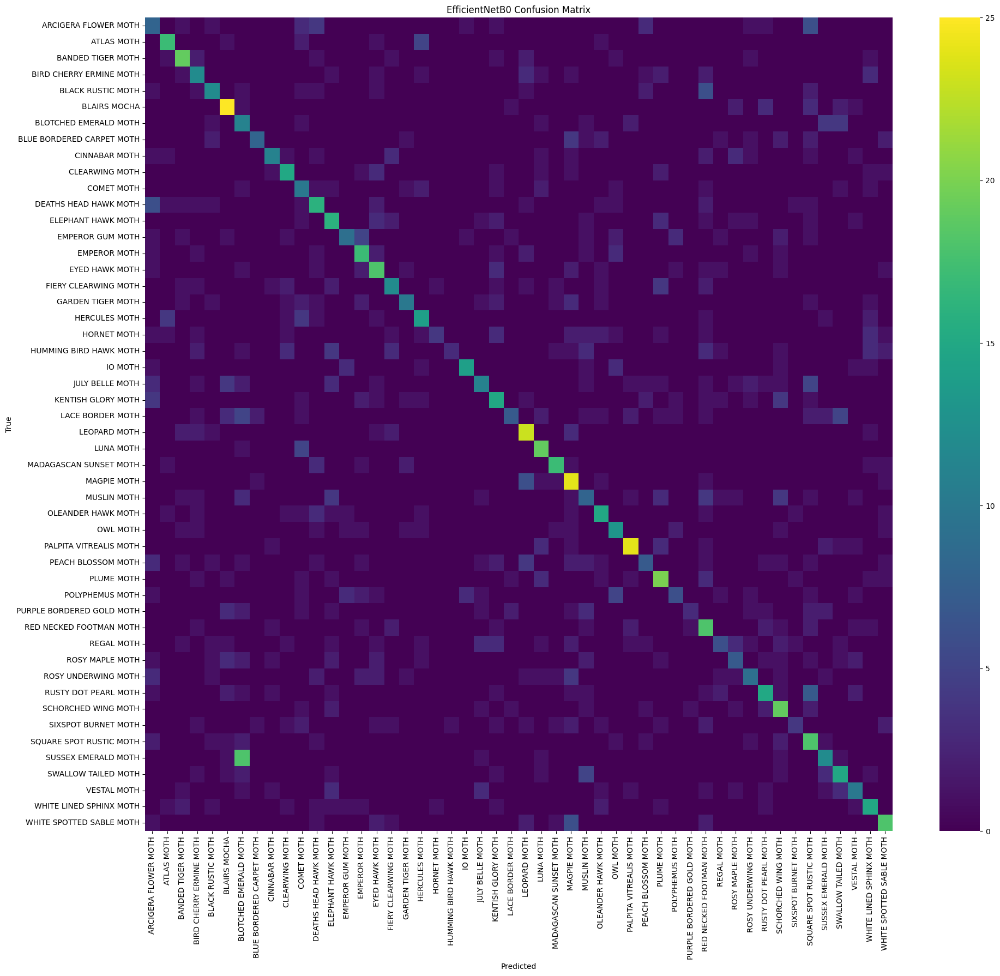

In [ ]:
plt.figure(figsize=(20, 18))
sns.heatmap(cm,
            xticklabels=class_names,
            yticklabels=class_names,
            cmap='viridis',
            annot=False,
            fmt='d',
            cbar=True)

plt.title("EfficientNetB0 Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [ ]:
# Identify top confused class pairs

confused_pairs = []

for i in range(len(class_names)):
    for j in range(len(class_names)):
        if i != j and cm[i, j] > 0:
            confused_pairs.append((cm[i, j], class_names[i], class_names[j]))

confused_pairs.sort(reverse=True)

print("Top 10 most confused pairs:")
for count, true_cls, pred_cls in confused_pairs[:10]:
    print(f"{true_cls} → {pred_cls}: {count} times")


Top 10 most confused pairs:
SUSSEX EMERALD MOTH → BLOTCHED EMERALD MOTH: 18 times
RUSTY DOT PEARL MOTH → SQUARE SPOT RUSTIC MOTH: 7 times
WHITE SPOTTED SABLE MOTH → MAGPIE MOTH: 6 times
MAGPIE MOTH → LEOPARD MOTH: 6 times
DEATHS HEAD HAWK MOTH → ARCIGERA FLOWER MOTH: 6 times
BLACK RUSTIC MOTH → RED NECKED FOOTMAN MOTH: 6 times
ARCIGERA FLOWER MOTH → SQUARE SPOT RUSTIC MOTH: 6 times
SWALLOW TAILED MOTH → MUSLIN MOTH: 5 times
POLYPHEMUS MOTH → OWL MOTH: 5 times
LUNA MOTH → COMET MOTH: 5 times


In [ ]:
model.save('efficientnet_b0_frozen.h5')


In [ ]:
from google.colab import files
files.download('efficientnet_b0_frozen.h5')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('efficientnet_b0_frozen.h5')

In [ ]:
loss, acc = model.evaluate(test_ds)
print(f"Test Accuracy: {acc:.2%}")

49/49 ━━━━━━━━━━━━━━━━━━━━ 133s 2s/step - accuracy: 0.8748 - loss: 0.4997
Test Accuracy: 88.70%


In [ ]:
model.summary()  # Check total/non-trainable params

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 50)             │         6,450 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,219,991 (16.10 MB)

 Trainable params: 170,418 (665.70 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

 Optimizer params: 2 (12.00 B)

In [ ]:
for layer in model.layers:
    print(layer.name, layer.trainable)

data_augmentation True
efficientnetb0 False
global_average_pooling2d_1 True
dense_2 True
dropout_1 True
dense_3 True


In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Input
from tensorflow.keras.optimizers import Adam

# Set random seed for reproducibility
tf.random.set_seed(42)

# Define model
def build_frozen_efficientnet(input_shape, num_classes):
    base_model = EfficientNetB0(include_top=False, input_shape=input_shape, weights='imagenet')
    base_model.trainable = False  # Freeze base

    x = GlobalAveragePooling2D()(base_model.output)
    output = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=output)
    return model

model = build_frozen_efficientnet((224, 224, 3), num_classes=50)
model.compile(optimizer=Adam(1e-3), loss='categorical_crossentropy', metrics=['accuracy'])

# Train
checkpoint_cb = ModelCheckpoint("efficientnet_b0_frozen.h5", save_best_only=True)
history = model.fit(train_ds, validation_data=val_ds, epochs=10, callbacks=[checkpoint_cb])


Epoch 1/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4562 - loss: 2.5961

141/141 ━━━━━━━━━━━━━━━━━━━━ 493s 3s/step - accuracy: 0.4579 - loss: 2.5898 - val_accuracy: 0.8819 - val_loss: 0.7405
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9268 - loss: 0.5433

141/141 ━━━━━━━━━━━━━━━━━━━━ 494s 3s/step - accuracy: 0.9269 - loss: 0.5429 - val_accuracy: 0.9087 - val_loss: 0.4729
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9500 - loss: 0.3247

141/141 ━━━━━━━━━━━━━━━━━━━━ 438s 3s/step - accuracy: 0.9500 - loss: 0.3246 - val_accuracy: 0.9165 - val_loss: 0.3883
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9676 - loss: 0.2262

141/141 ━━━━━━━━━━━━━━━━━━━━ 474s 3s/step - accuracy: 0.9676 - loss: 0.2262 - val_accuracy: 0.9217 - val_loss: 0.3480
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9755 - loss: 0.1736

141/141 ━━━━━━━━━━━━━━━━━━━━ 499s 3s/step - accuracy: 0.9755 - loss: 0.1736 - val_accuracy: 0.9269 - val_loss: 0.3216
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9819 - loss: 0.1384

141/141 ━━━━━━━━━━━━━━━━━━━━ 471s 3s/step - accuracy: 0.9819 - loss: 0.1383 - val_accuracy: 0.9243 - val_loss: 0.3085
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9855 - loss: 0.1131

141/141 ━━━━━━━━━━━━━━━━━━━━ 477s 3s/step - accuracy: 0.9855 - loss: 0.1131 - val_accuracy: 0.9269 - val_loss: 0.2972
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9897 - loss: 0.0948

141/141 ━━━━━━━━━━━━━━━━━━━━ 439s 3s/step - accuracy: 0.9897 - loss: 0.0947 - val_accuracy: 0.9250 - val_loss: 0.2913
Epoch 9/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9926 - loss: 0.0796

141/141 ━━━━━━━━━━━━━━━━━━━━ 468s 3s/step - accuracy: 0.9926 - loss: 0.0796 - val_accuracy: 0.9276 - val_loss: 0.2872
Epoch 10/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9938 - loss: 0.0688

141/141 ━━━━━━━━━━━━━━━━━━━━ 501s 3s/step - accuracy: 0.9938 - loss: 0.0688 - val_accuracy: 0.9302 - val_loss: 0.2807


In [ ]:
model = load_model("efficientnet_b0_frozen.h5")
loss, acc = model.evaluate(test_ds)
print(f"Final Test Accuracy (Frozen EfficientNetB0): {acc:.2%}")


49/49 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9285 - loss: 0.2963
Final Test Accuracy (Frozen EfficientNetB0): 94.29%


In [ ]:
model.save("efficientnet_b0_frozen_final.keras")

In [ ]:
files.download("efficientnet_b0_frozen_final.keras")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
model = load_model("efficientnet_b0_frozen_final.keras")


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 6 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
print(classification_report(y_true, y_pred, target_names=class_names))

NameError: name 'y_true' is not defined

In [ ]:
# Get all test images and labels
y_true = []
y_pred = []
images = []

for batch_images, batch_labels in test_ds:
    preds = model.predict(batch_images)
    y_true.extend(np.argmax(batch_labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))
    images.extend(batch_images.numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)
images = np.array(images)


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 

In [ ]:
misclassified_indices = np.where(y_true != y_pred)[0]
print(f"Number of misclassified samples: {len(misclassified_indices)}")

Number of misclassified samples: 88


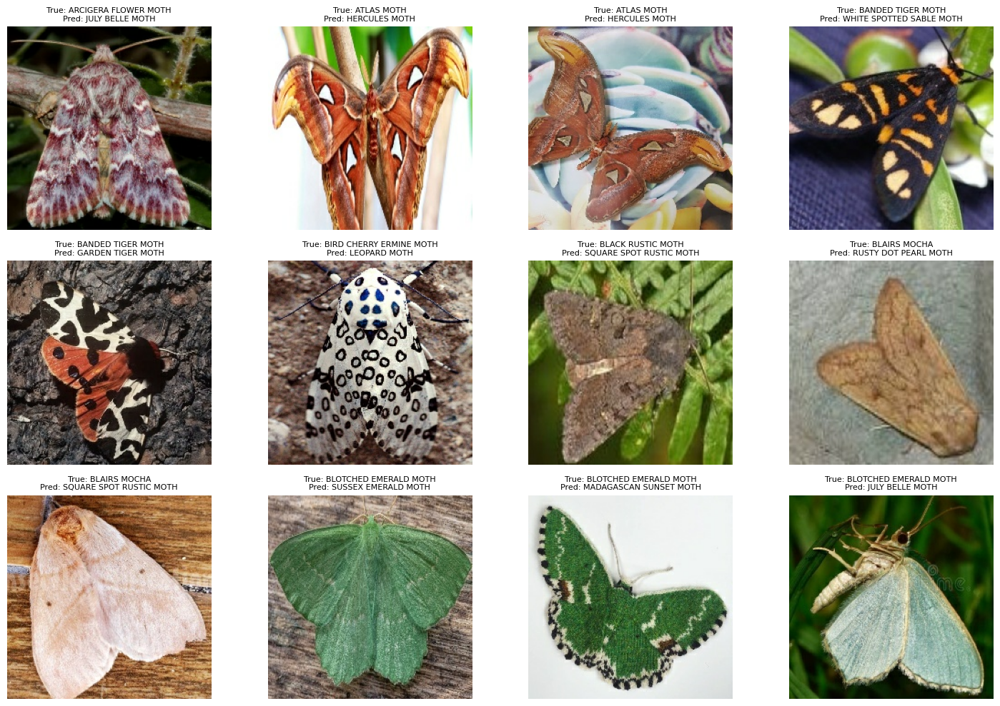

In [ ]:
def plot_misclassified_samples(n=12):
    plt.figure(figsize=(15, 10))
    for i, idx in enumerate(misclassified_indices[:n]):
        plt.subplot(3, 4, i + 1)
        plt.imshow(images[idx].astype("uint8"))
        true_label = class_names[y_true[idx]]
        pred_label = class_names[y_pred[idx]]
        plt.title(f"True: {true_label}\nPred: {pred_label}", fontsize=8)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_misclassified_samples()


In [ ]:
# Extract scalar class indices from one-hot encoded or sparse labels
y_train_labels = []

for _, label in train_ds.unbatch():
    label_val = label.numpy()
    class_index = np.argmax(label_val) if label_val.ndim > 0 else label_val.item()
    y_train_labels.append(class_index)

y_train_labels = np.array(y_train_labels)


In [ ]:
class_indices = np.unique(y_train_labels)

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=class_indices,
    y=y_train_labels
)

class_weight_dict = dict(zip(class_indices, class_weights))


In [ ]:
def build_finetune_model(num_classes):
    base_model = tf.keras.applications.EfficientNetB0(
        include_top=False, input_shape=(224, 224, 3), weights='imagenet'
    )
    base_model.trainable = True  # unfreeze all layers

    inputs = tf.keras.Input(shape=(224, 224, 3))
    x = tf.keras.applications.efficientnet.preprocess_input(inputs)
    x = base_model(x, training=True)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = tf.keras.Model(inputs, outputs)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Instantiate the model
model = build_finetune_model(num_classes=len(class_weight_dict))


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
for _, label in train_ds.take(1):
    print(label.shape)  # If (batch_size, 50) → one-hot encoded

(32, 50)


In [ ]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


In [ ]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    class_weight=class_weight_dict
)

Epoch 1/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1413s 10s/step - accuracy: 0.6220 - loss: 1.6135 - val_accuracy: 0.8728 - val_loss: 0.4208
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1309s 9s/step - accuracy: 0.9154 - loss: 0.2983 - val_accuracy: 0.9093 - val_loss: 0.3398
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1349s 10s/step - accuracy: 0.9476 - loss: 0.1620 - val_accuracy: 0.9061 - val_loss: 0.3408
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1353s 10s/step - accuracy: 0.9568 - loss: 0.1409 - val_accuracy: 0.9041 - val_loss: 0.3782
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1301s 9s/step - accuracy: 0.9685 - loss: 0.0934 - val_accuracy: 0.8624 - val_loss: 0.6073
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1302s 9s/step - accuracy: 0.9775 - loss: 0.0871 - val_accuracy: 0.9074 - val_loss: 0.4013
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1389s 10s/step - accuracy: 0.9764 - loss: 0.0786 - val_accuracy: 0.8858 - val_loss: 0.5328
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1394s 10s/step - accuracy: 0.9751 - loss: 0.08

In [ ]:
# Evaluate model
test_loss, test_acc = model.evaluate(test_ds)
print(f"\n✅ Final Test Accuracy: {test_acc:.4f} | Test Loss: {test_loss:.4f}")

# Optional: classification report
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(np.argmax(labels.numpy(), axis=1))  # adjust if labels are sparse
    y_pred.extend(np.argmax(preds, axis=1))

print("\nClassification Report:")
print(classification_report(y_true, y_pred))


49/49 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - accuracy: 0.8852 - loss: 0.6444

✅ Final Test Accuracy: 0.8701 | Test Loss: 0.6762
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━

In [ ]:
model.save("efficientnet_b0_finetuned_final.keras")

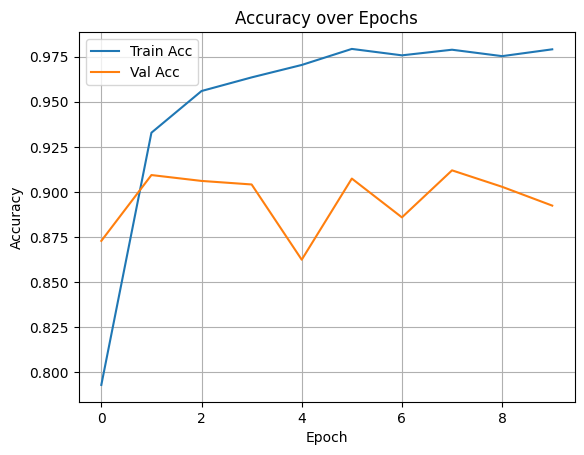

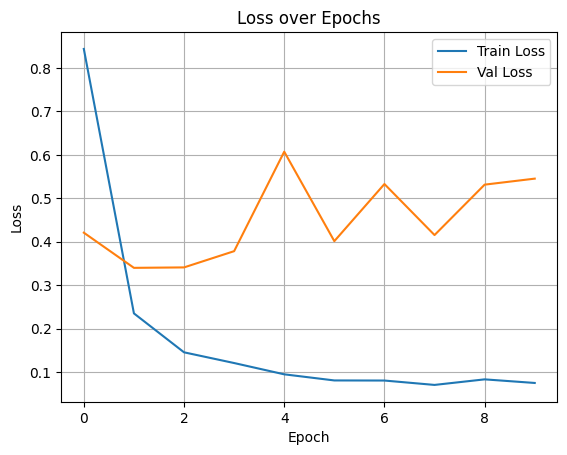

In [ ]:
# Accuracy
plt.figure()
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Loss
plt.figure()
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
files.download("efficientnet_b0_finetuned_final.keras")


NameError: name 'files' is not defined

In [ ]:
from tensorflow.keras.models import load_model
model = load_model("efficientnet_b0_finetuned_final.keras")


Grad model built. Inputs: (None, 224, 224, 3)   Conv/Pred outputs: [(None, 7, 7, 320), (None, 50)]


/tmp/ipython-input-1721560452.py:65: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  overlay = np.clip((img_uint8/255.0)*(1-alpha) + cm.get_cmap('jet')(hm)[...,:3]*alpha, 0, 1)


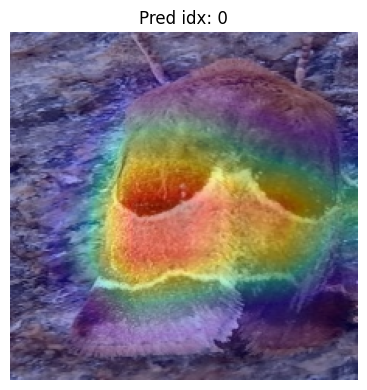

In [ ]:
import tensorflow as tf, numpy as np, matplotlib.pyplot as plt, os
from tensorflow.keras.models import Model

# ==== 1) Config: backbone + target conv ====
# For EfficientNetB0:
BACKBONE_NAME = "efficientnetb0"
LAST_CONV      = "block7a_project_conv"   # try "top_conv" if this ever fails


IMG_SIZE = (224, 224)
PREPROCESS_FN = None

# ==== 2) Build a single-graph Grad-CAM model ====
def build_gradcam_model(model, backbone_name, last_conv_name):
    base = model.get_layer(backbone_name)
    # conv fmap from inside the base
    conv_tensor = base.get_layer(last_conv_name).output

    # rebuild the head by reusing the layers that come AFTER the base in model
    passed_base = False
    x = base.output
    for l in model.layers:
        if not passed_base:
            passed_base = (l.name == backbone_name)
            continue
        x = l(x)  # reuse same layer objects -> shared weights

    preds = x  # final softmax
    return Model(inputs=base.input, outputs=[conv_tensor, preds])

grad_model = build_gradcam_model(model, BACKBONE_NAME, LAST_CONV)
print("Grad model built. Inputs:", grad_model.input_shape, "  Conv/Pred outputs:",
      grad_model.output_shape)

# ==== 3) Grad-CAM for a single image tensor ====
def gradcam_for_tensor(img_uint8, grad_model):
    # img_uint8: (H,W,3) uint8 in [0,255]
    x = tf.cast(tf.expand_dims(img_uint8, 0), tf.float32)
    if PREPROCESS_FN is not None:
        x = PREPROCESS_FN(x)

    with tf.GradientTape() as tape:
        conv_out, preds = grad_model(x, training=False)     # SAME graph for both
        pred_idx = tf.argmax(preds[0])
        class_score = preds[:, pred_idx]

    grads  = tape.gradient(class_score, conv_out)           # (1,Hc,Wc,C)
    if grads is None:
        raise RuntimeError("Gradients are None (disconnected). Check BACKBONE_NAME/LAST_CONV.")
    pooled = tf.reduce_mean(grads, axis=(0,1,2))            # (C,)
    fmap   = conv_out[0]                                     # (Hc,Wc,C)
    heat   = tf.reduce_sum(fmap * pooled, axis=-1)           # (Hc,Wc)
    heat   = tf.nn.relu(heat)
    m      = tf.reduce_max(heat)
    heat   = (heat / m) if m > 0 else heat
    return heat.numpy(), int(pred_idx.numpy())

def overlay(img_uint8, heatmap, alpha=0.35):
    import matplotlib.cm as cm
    H,W = img_uint8.shape[:2]
    hm  = tf.image.resize(heatmap[...,None], (H,W)).numpy().squeeze()
    overlay = np.clip((img_uint8/255.0)*(1-alpha) + cm.get_cmap('jet')(hm)[...,:3]*alpha, 0, 1)
    return overlay

# ==== 4) Test on a real file ====
# Pick any test image path
import glob
img_path = sorted(glob.glob("split_data/test/*/*.jpg"))[0]
img = tf.image.resize(tf.image.decode_jpeg(tf.io.read_file(img_path), channels=3), IMG_SIZE)
img_uint8 = tf.cast(tf.clip_by_value(img, 0, 255), tf.uint8).numpy()

heat, pred_idx = gradcam_for_tensor(img_uint8, grad_model)
fig = plt.figure(figsize=(4,4))
plt.imshow(overlay(img_uint8, heat))
title = f"Pred idx: {pred_idx}"
try:
    # show class names if available
    title = f"Pred: {test_ds.class_names[pred_idx]}"
except Exception:
    pass
plt.title(title); plt.axis('off'); plt.tight_layout(); plt.show()

# ==== 5) (Optional) Batch over test_ds and save N overlays ====
def export_gradcams(dataset, grad_model, n_images=24, outdir="gradcam_examples"):
    os.makedirs(outdir, exist_ok=True)
    saved = 0
    for images, labels in dataset:
        B = images.shape[0]
        for b in range(B):
            img_u8 = images[b].numpy().astype('uint8')
            heat, pred_idx = gradcam_for_tensor(img_u8, grad_model)
            pred_name = (test_ds.class_names[pred_idx]
                         if hasattr(test_ds, "class_names") else str(pred_idx))
            true_name = None
            if labels is not None:
                if hasattr(labels, "shape") and labels.shape[-1] > 1:
                    ti = int(tf.argmax(labels[b]).numpy())
                else:
                    ti = int(tf.cast(labels[b], tf.int32).numpy())
                true_name = (test_ds.class_names[ti] if hasattr(test_ds, "class_names") else str(ti))

            ov = overlay(img_u8, heat)
            plt.figure(figsize=(4,4)); plt.imshow(ov); plt.axis('off')
            title = f"Pred: {pred_name}" + (f" | True: {true_name}" if true_name is not None else "")
            plt.title(title)
            fname = os.path.join(outdir, f"gradcam_{saved:04d}_{pred_name}.png")
            plt.savefig(fname, dpi=200, bbox_inches='tight'); plt.close()
            saved += 1
            if saved >= n_images:
                print(f"Saved {saved} overlays to {outdir}")
                return
    print(f"Saved {saved} overlays to {outdir}")

# export_gradcams(test_ds, grad_model, n_images=24)



In [ ]:
import os, glob, numpy as np, matplotlib.pyplot as plt, tensorflow as tf
from collections import defaultdict
from pathlib import Path

# --- get class names safely (from dataset if present, else from folder names) ---
def get_class_names(dataset=None, root="split_data/test"):
    if dataset is not None and hasattr(dataset, "class_names"):
        return list(dataset.class_names)
    classes = [p.name for p in Path(root).iterdir() if p.is_dir()]
    classes.sort()
    return classes

CLASS_NAMES = get_class_names(test_ds, root="split_data/test")
print("Classes:", len(CLASS_NAMES), CLASS_NAMES[:5], "...")

def load_uint8(img_path, size=(224,224)):
    img = tf.image.decode_jpeg(tf.io.read_file(img_path), channels=3)
    img = tf.image.resize(img, size)
    return tf.cast(tf.clip_by_value(img, 0, 255), tf.uint8).numpy()

def export_confused_pairs(grad_model, root="split_data/test",
                          k_pairs=5, per_pair=4, outdir="gradcam_pairs"):
    os.makedirs(outdir, exist_ok=True)

    # 1) Gather all test files
    files, y_true = [], []
    for cls in CLASS_NAMES:
        for p in glob.glob(os.path.join(root, cls, "*.jpg")):
            files.append(p)
            y_true.append(CLASS_NAMES.index(cls))

    # 2) Predict and collect correct/incorrect
    pair_to_items = defaultdict(list)
    correct_by_class = defaultdict(list)

    for path, t_idx in zip(files, y_true):
        img_u8 = load_uint8(path, (224,224))
        x = tf.cast(tf.expand_dims(img_u8, 0), tf.float32)
        preds = model(x, training=False).numpy()[0]
        p_idx = int(np.argmax(preds))

        if p_idx != t_idx:
            heat, _ = gradcam_for_tensor(img_u8, grad_model)
            pair_to_items[(t_idx, p_idx)].append((path, img_u8, heat, t_idx, p_idx))
        else:
            correct_by_class[t_idx].append(path)

    # 3) Top-K confused pairs
    top = sorted(pair_to_items.items(), key=lambda kv: len(kv[1]), reverse=True)[:k_pairs]
    print("Top confused pairs:",
          [(CLASS_NAMES[a], CLASS_NAMES[b], len(v)) for (a,b),v in top])

    # 4) Save overlays for misclassifications + a correct exemplar per class
    saved = 0
    for (t_idx, p_idx), items in top:
        pair_dir = os.path.join(outdir, f"{CLASS_NAMES[t_idx]}__to__{CLASS_NAMES[p_idx]}")
        os.makedirs(pair_dir, exist_ok=True)

        # misclassified examples
        for i, (_, img_u8, heat, _, _) in enumerate(items[:per_pair]):
            ov = overlay(img_u8, heat)
            plt.figure(figsize=(4,4)); plt.imshow(ov); plt.axis('off')
            plt.title(f"True: {CLASS_NAMES[t_idx]} | Pred: {CLASS_NAMES[p_idx]}")
            plt.savefig(os.path.join(pair_dir, f"mis_{i:02d}.png"),
                        dpi=200, bbox_inches='tight')
            plt.close(); saved += 1

        # one correct exemplar from each class (if available)
        for cls_idx, tag in [(t_idx, "true_class_correct"), (p_idx, "pred_class_correct")]:
            if correct_by_class[cls_idx]:
                path_ok = correct_by_class[cls_idx][0]
                img_ok = load_uint8(path_ok)
                heat_ok, _ = gradcam_for_tensor(img_ok, grad_model)
                ov_ok = overlay(img_ok, heat_ok)
                plt.figure(figsize=(4,4)); plt.imshow(ov_ok); plt.axis('off')
                plt.title(f"Correct: {CLASS_NAMES[cls_idx]}")
                plt.savefig(os.path.join(pair_dir, f"{tag}.png"),
                            dpi=200, bbox_inches='tight')
                plt.close(); saved += 1

    print(f"Saved {saved} images to {outdir}")

# Run it
export_confused_pairs(grad_model, k_pairs=5, per_pair=4, outdir="gradcam_pairs")


Classes: 50 ['ARCIGERA FLOWER MOTH', 'ATLAS MOTH', 'BANDED TIGER MOTH', 'BIRD CHERRY ERMINE MOTH', 'BLACK RUSTIC MOTH'] ...
Top confused pairs: [('SUSSEX EMERALD MOTH', 'BLOTCHED EMERALD MOTH', 9), ('ROSY MAPLE MOTH', 'ELEPHANT HAWK MOTH', 6), ('MAGPIE MOTH', 'BANDED TIGER MOTH', 5), ('WHITE LINED SPHINX MOTH', 'BANDED TIGER MOTH', 5), ('JULY BELLE MOTH', 'SCHORCHED WING MOTH', 3)]


/tmp/ipython-input-1721560452.py:65: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  overlay = np.clip((img_uint8/255.0)*(1-alpha) + cm.get_cmap('jet')(hm)[...,:3]*alpha, 0, 1)


Saved 29 images to gradcam_pairs


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_1']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


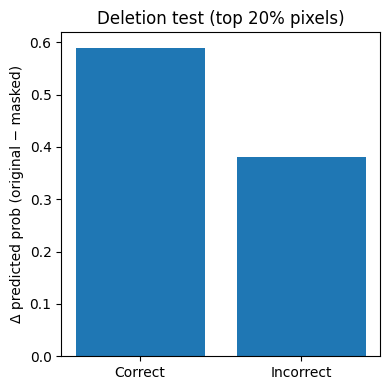

Correct mean drop:   0.590 (n=117)
Incorrect mean drop: 0.380 (n=3)


In [ ]:
import glob, os, numpy as np, tensorflow as tf, matplotlib.pyplot as plt
from pathlib import Path

def get_class_names_from_dir(root="split_data/test"):
    classes = sorted([p.name for p in Path(root).iterdir() if p.is_dir()])
    return classes

CLASS_NAMES = get_class_names_from_dir("split_data/test")

def deletion_drop(img_u8, grad_model, frac=0.2):
    x = tf.cast(tf.expand_dims(img_u8, 0), tf.float32)
    p0 = model(x, training=False).numpy()[0]
    idx = int(np.argmax(p0)); p0 = float(p0[idx])

    heat, _ = gradcam_for_tensor(img_u8, grad_model)
    hm = tf.image.resize(heat[...,None], img_u8.shape[:2]).numpy().squeeze()
    thr = np.quantile(hm, 1.0 - frac)
    mask = hm >= thr

    x_del = x.numpy()
    x_del[0][mask] = 0
    p1 = float(model(x_del, training=False).numpy()[0][idx])
    return p0 - p1, idx

def run_deletion_test(root="split_data/test", n=100, frac=0.2):
    files = sorted(glob.glob(os.path.join(root, "*/*.jpg")))[:n]
    drops_correct, drops_wrong = [], []
    for path in files:
        true_idx = CLASS_NAMES.index(Path(path).parent.name)
        img = tf.image.decode_jpeg(tf.io.read_file(path), channels=3)
        img = tf.image.resize(img, (224,224))
        img_u8 = tf.cast(tf.clip_by_value(img, 0, 255), tf.uint8).numpy()

        drop, pred_idx = deletion_drop(img_u8, grad_model, frac=frac)
        (drops_correct if pred_idx == true_idx else drops_wrong).append(drop)

    mc, mw = np.mean(drops_correct or [np.nan]), np.mean(drops_wrong or [np.nan])

    plt.figure(figsize=(4,4))
    plt.bar(["Correct","Incorrect"], [mc, mw])
    plt.title(f"Deletion test (top {int(frac*100)}% pixels)")
    plt.ylabel("Δ predicted prob (original − masked)")
    plt.tight_layout(); plt.show()

    print(f"Correct mean drop:   {mc:.3f} (n={len(drops_correct)})")
    print(f"Incorrect mean drop: {mw:.3f} (n={len(drops_wrong)})")
    return drops_correct, drops_wrong

_ = run_deletion_test(n=120, frac=0.2)


In [ ]:
import os, matplotlib.pyplot as plt, numpy as np
from PIL import Image

def montage_pair_dir(pair_dir, out_path, ncols=4, nrows=3):
    # collect images: prefer 'mis_*.png' first, then the two correct refs
    imgs = [os.path.join(pair_dir, f) for f in sorted(os.listdir(pair_dir)) if f.startswith("mis_")]
    for ref in ["true_class_correct.png","pred_class_correct.png"]:
        p = os.path.join(pair_dir, ref)
        if os.path.exists(p): imgs.append(p)

    imgs = imgs[:ncols*nrows]
    if not imgs: return False

    fig = plt.figure(figsize=(ncols*3, nrows*3))
    for i, fp in enumerate(imgs):
        ax = plt.subplot(nrows, ncols, i+1)
        ax.imshow(Image.open(fp)); ax.axis("off")
        ax.set_title(os.path.basename(fp).replace(".png",""), fontsize=9)
    plt.tight_layout()
    plt.savefig(out_path, dpi=200, bbox_inches="tight"); plt.close()
    return True

root = "gradcam_pairs"
for d in sorted(os.listdir(root)):
    pair_dir = os.path.join(root, d)
    if os.path.isdir(pair_dir):
        outp = os.path.join(pair_dir, "panel.png")
        ok = montage_pair_dir(pair_dir, outp)
        if ok: print("Wrote", outp)


Wrote gradcam_pairs/JULY BELLE MOTH__to__SCHORCHED WING MOTH/panel.png
Wrote gradcam_pairs/MAGPIE MOTH__to__BANDED TIGER MOTH/panel.png
Wrote gradcam_pairs/ROSY MAPLE MOTH__to__ELEPHANT HAWK MOTH/panel.png
Wrote gradcam_pairs/SUSSEX EMERALD MOTH__to__BLOTCHED EMERALD MOTH/panel.png
Wrote gradcam_pairs/WHITE LINED SPHINX MOTH__to__BANDED TIGER MOTH/panel.png


In [ ]:
def gradcampp_for_tensor(img_uint8, grad_model, preprocess_fn=None):
    """
    Grad-CAM++ for a single uint8 image (H,W,3) using your existing grad_model.
    Returns (heatmap[0..1], pred_idx).
    """
    import tensorflow as tf
    x = tf.cast(tf.expand_dims(img_uint8, 0), tf.float32)
    if preprocess_fn is not None:
        x = preprocess_fn(x)

    with tf.GradientTape() as tape:
        conv_out, preds = grad_model(x, training=False)        # conv_out: (1,Hc,Wc,C)
        pred_idx = tf.argmax(preds[0])
        class_score = preds[:, pred_idx]

    # First derivative
    grads = tape.gradient(class_score, conv_out)               # (1,Hc,Wc,C)
    # Following the common Grad-CAM++ formulation
    grads2 = grads * grads
    grads3 = grads2 * grads
    A = conv_out                                               # alias

    # alpha weights (per-pixel, per-channel)
    eps = 1e-7
    alpha_num = grads2
    alpha_den = 2.0 * grads2 + A * grads3 + eps
    alphas = alpha_num / alpha_den                             # (1,Hc,Wc,C)

    # channel weights
    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(1, 2))  # (1,C)

    # class activation map
    cam = tf.reduce_sum(weights[:, None, None, :] * A, axis=-1)       # (1,Hc,Wc)
    cam = tf.nn.relu(cam)[0]
    m = tf.reduce_max(cam)
    cam = (cam / m) if m > 0 else cam
    return cam.numpy(), int(pred_idx.numpy())


/tmp/ipython-input-1721560452.py:65: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  overlay = np.clip((img_uint8/255.0)*(1-alpha) + cm.get_cmap('jet')(hm)[...,:3]*alpha, 0, 1)


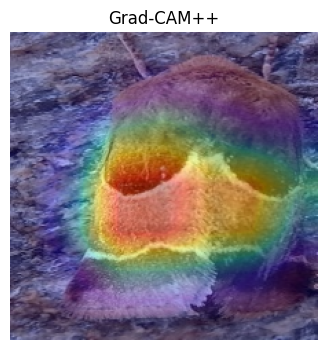

In [ ]:
# Example on the same image used before
heat_pp, pred_idx = gradcampp_for_tensor(img_uint8, grad_model)  # preprocess_fn=None for your run
ov_pp = overlay(img_uint8, heat_pp)
plt.figure(figsize=(4,4)); plt.imshow(ov_pp); plt.axis('off'); plt.title("Grad-CAM++"); plt.show()


In [ ]:
import os, glob, numpy as np, matplotlib.pyplot as plt, tensorflow as tf
from collections import defaultdict
from pathlib import Path

# --- make sure we have class names  ---
def get_class_names(dataset=None, root="split_data/test"):
    if dataset is not None and hasattr(dataset, "class_names"):
        return list(dataset.class_names)
    classes = [p.name for p in Path(root).iterdir() if p.is_dir()]
    classes.sort()
    return classes

CLASS_NAMES = get_class_names(test_ds, root="split_data/test")
print("Classes:", len(CLASS_NAMES), CLASS_NAMES[:5], "...")

def load_uint8(img_path, size=(224,224)):
    img = tf.image.decode_jpeg(tf.io.read_file(img_path), channels=3)
    img = tf.image.resize(img, size)
    return tf.cast(tf.clip_by_value(img, 0, 255), tf.uint8).numpy()

def save_cam_comparison(img_u8, title, out_path, grad_model=grad_model, alpha=0.35):
    # Compute both maps
    heat_cam,  _ = gradcam_for_tensor(img_u8, grad_model)
    heat_pp,   _ = gradcampp_for_tensor(img_u8, grad_model)

    # Build overlays
    ov_cam  = overlay(img_u8, heat_cam,  alpha=alpha)
    ov_pp   = overlay(img_u8, heat_pp,   alpha=alpha)

    # Panel: Original | Grad-CAM | Grad-CAM++
    fig = plt.figure(figsize=(9,3))
    ax1 = plt.subplot(1,3,1); ax1.imshow(img_u8);  ax1.set_title("Original");  ax1.axis('off')
    ax2 = plt.subplot(1,3,2); ax2.imshow(ov_cam);  ax2.set_title("Grad-CAM");  ax2.axis('off')
    ax3 = plt.subplot(1,3,3); ax3.imshow(ov_pp);   ax3.set_title("Grad-CAM++");ax3.axis('off')
    plt.suptitle(title, fontsize=10)
    plt.tight_layout(rect=[0,0,1,0.92])
    plt.savefig(out_path, dpi=200, bbox_inches='tight'); plt.close()

def export_confused_pairs_bicams(grad_model, root="split_data/test",
                                 k_pairs=5, per_pair=4, outdir="gradcam_pairs_bicams"):
    os.makedirs(outdir, exist_ok=True)

    # 1) gather test files
    files, y_true = [], []
    for cls in CLASS_NAMES:
        for p in glob.glob(os.path.join(root, cls, "*.jpg")):
            files.append(p)
            y_true.append(CLASS_NAMES.index(cls))

    # 2) predict; split correct/incorrect
    pair_to_items = defaultdict(list)
    correct_by_class = defaultdict(list)

    for path, t_idx in zip(files, y_true):
        img_u8 = load_uint8(path, (224,224))
        x = tf.cast(tf.expand_dims(img_u8, 0), tf.float32)
        preds = model(x, training=False).numpy()[0]
        p_idx = int(np.argmax(preds))

        if p_idx != t_idx:
            pair_to_items[(t_idx, p_idx)].append((path, img_u8, t_idx, p_idx))
        else:
            correct_by_class[t_idx].append(path)

    # 3) top-K pairs
    top = sorted(pair_to_items.items(), key=lambda kv: len(kv[1]), reverse=True)[:k_pairs]
    print("Top confused pairs:",
          [(CLASS_NAMES[a], CLASS_NAMES[b], len(v)) for (a,b),v in top])

    # 4) save side-by-side panels
    saved = 0
    for (t_idx, p_idx), items in top:
        pair_dir = os.path.join(outdir, f"{CLASS_NAMES[t_idx]}__to__{CLASS_NAMES[p_idx]}")
        os.makedirs(pair_dir, exist_ok=True)

        # misclassified examples
        for i, (_, img_u8, _, _) in enumerate(items[:per_pair]):
            title = f"True: {CLASS_NAMES[t_idx]}  |  Pred: {CLASS_NAMES[p_idx]}"
            fp = os.path.join(pair_dir, f"cmp_mis_{i:02d}.png")
            save_cam_comparison(img_u8, title, fp, grad_model=grad_model)
            saved += 1

        # one correct exemplar from each class (if available)
        for cls_idx, tag in [(t_idx, "cmp_true_class_correct.png"),
                             (p_idx, "cmp_pred_class_correct.png")]:
            if correct_by_class[cls_idx]:
                img_ok = load_uint8(correct_by_class[cls_idx][0])
                title = f"Correct: {CLASS_NAMES[cls_idx]}"
                fp = os.path.join(pair_dir, tag)
                save_cam_comparison(img_ok, title, fp, grad_model=grad_model)
                saved += 1

    print(f"Saved {saved} comparison panels to {outdir}")

# Run it
export_confused_pairs_bicams(grad_model, k_pairs=5, per_pair=4, outdir="gradcam_pairs_bicams")


Classes: 50 ['ARCIGERA FLOWER MOTH', 'ATLAS MOTH', 'BANDED TIGER MOTH', 'BIRD CHERRY ERMINE MOTH', 'BLACK RUSTIC MOTH'] ...
Top confused pairs: [('SUSSEX EMERALD MOTH', 'BLOTCHED EMERALD MOTH', 9), ('ROSY MAPLE MOTH', 'ELEPHANT HAWK MOTH', 6), ('MAGPIE MOTH', 'BANDED TIGER MOTH', 5), ('WHITE LINED SPHINX MOTH', 'BANDED TIGER MOTH', 5), ('JULY BELLE MOTH', 'SCHORCHED WING MOTH', 3)]


/tmp/ipython-input-1721560452.py:65: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  overlay = np.clip((img_uint8/255.0)*(1-alpha) + cm.get_cmap('jet')(hm)[...,:3]*alpha, 0, 1)


Saved 29 comparison panels to gradcam_pairs_bicams


In [ ]:
import os, matplotlib.pyplot as plt
from PIL import Image

def montage_pair_dir_bicams(pair_dir, out_path, ncols=3, nrows=3):
    panels = [os.path.join(pair_dir, f) for f in sorted(os.listdir(pair_dir)) if f.startswith("cmp_")]
    panels = panels[:ncols*nrows]
    if not panels: return False

    fig = plt.figure(figsize=(ncols*3, nrows*3))
    for i, fp in enumerate(panels):
        ax = plt.subplot(nrows, ncols, i+1)
        ax.imshow(Image.open(fp)); ax.axis("off")
        ax.set_title(os.path.basename(fp).replace(".png",""), fontsize=9)
    plt.tight_layout()
    plt.savefig(out_path, dpi=200, bbox_inches="tight"); plt.close()
    return True

root = "gradcam_pairs_bicams"
for d in sorted(os.listdir(root)):
    pair_dir = os.path.join(root, d)
    if os.path.isdir(pair_dir):
        outp = os.path.join(pair_dir, "panel_bicams.png")
        ok = montage_pair_dir_bicams(pair_dir, outp)
        if ok: print("Wrote", outp)


Wrote gradcam_pairs_bicams/JULY BELLE MOTH__to__SCHORCHED WING MOTH/panel_bicams.png
Wrote gradcam_pairs_bicams/MAGPIE MOTH__to__BANDED TIGER MOTH/panel_bicams.png
Wrote gradcam_pairs_bicams/ROSY MAPLE MOTH__to__ELEPHANT HAWK MOTH/panel_bicams.png
Wrote gradcam_pairs_bicams/SUSSEX EMERALD MOTH__to__BLOTCHED EMERALD MOTH/panel_bicams.png
Wrote gradcam_pairs_bicams/WHITE LINED SPHINX MOTH__to__BANDED TIGER MOTH/panel_bicams.png


In [ ]:
# === Pack & download all project artifacts ===
import os, json, zipfile, sys, subprocess, numpy as np
import tensorflow as tf
from pathlib import Path

EXPORT_DIR = Path("exports")
EXPORT_DIR.mkdir(exist_ok=True)

# 1) Save model
model_path = EXPORT_DIR / "model.keras"
model.save(model_path)

# 2) Save class names (use existing list or infer from folder)
def infer_class_names(root="split_data/test"):
    p = Path(root)
    if p.exists():
        names = sorted([d.name for d in p.iterdir() if d.is_dir()])
        if names: return names
    return []
try:
    CLASS_NAMES
except NameError:
    CLASS_NAMES = infer_class_names()
(CLASS_NAMES and print(f"Class names: {len(CLASS_NAMES)}")) or print("Class names list was empty.")
with open(EXPORT_DIR / "class_names.json", "w") as f:
    json.dump(CLASS_NAMES, f)

# 3) Env snapshot
with open(EXPORT_DIR / "env.txt", "w") as f:
    f.write(f"python: {sys.version}\n")
    f.write(f"tensorflow: {tf.__version__}\n")
reqs = subprocess.run([sys.executable, "-m", "pip", "freeze"], capture_output=True, text=True).stdout
with open(EXPORT_DIR / "requirements.txt", "w") as f:
    f.write(reqs)

# 4) Optional metrics arrays if present
if "y_true" in globals() and "y_pred" in globals():
    np.save(EXPORT_DIR / "y_true.npy", np.asarray(y_true))
    np.save(EXPORT_DIR / "y_pred.npy", np.asarray(y_pred))

# 5) Create a single bundle zip
BUNDLE = "erp_artifacts_bundle.zip"
def add_path(zf: zipfile.ZipFile, path: Path, arcname=None):
    path = Path(path)
    if not path.exists(): return
    if path.is_file():
        zf.write(path, arcname=arcname or path.name)
    else:
        base = arcname or path.name
        for root, _, files in os.walk(path):
            for fn in files:
                fp = Path(root) / fn
                zf.write(fp, arcname=str(Path(base) / fp.relative_to(path)))

with zipfile.ZipFile(BUNDLE, "w", compression=zipfile.ZIP_DEFLATED) as z:
    # always include exports/
    add_path(z, EXPORT_DIR, arcname="exports")
    # include Grad-CAM outputs if they exist
    for d in ["gradcam_examples", "gradcam_pairs", "gradcam_pairs_bicams"]:
        add_path(z, Path(d))
    # OPTIONAL: include split_data (can be large; comment out if you don’t want it)
    add_path(z, Path("split_data"))

print(f"Created bundle: {BUNDLE}, size ~{Path(BUNDLE).stat().st_size/1e6:.1f} MB")

# 6) Trigger download (Colab); otherwise print path
try:
    from google.colab import files
    files.download(BUNDLE)
except Exception as e:
    print(f"Download not available here. File is at: {Path(BUNDLE).resolve()}")


Class names: 50
Class names list was empty.
Created bundle: erp_artifacts_bundle.zip, size ~269.9 MB


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# 0) Imports
import json, os, pathlib, tensorflow as tf
from tensorflow.keras.models import load_model

# 1) Load the model you have in the sidebar
MODEL_PATH = "efficientnet_b0_finetuned_final.keras"   # adjust if your filename differs
model = load_model(MODEL_PATH, compile=False)
print("Loaded model from:", MODEL_PATH)

# 2) Recover class names (from file if present, else infer from folder names)
CLASS_NAMES_PATH = "exports/class_names.json"
if os.path.exists(CLASS_NAMES_PATH):
    with open(CLASS_NAMES_PATH) as f:
        CLASS_NAMES = json.load(f)
else:
    root = pathlib.Path("split_data/test")
    CLASS_NAMES = sorted([p.name for p in root.iterdir() if p.is_dir()])
print("Classes:", len(CLASS_NAMES), CLASS_NAMES[:5])

# 3) Rebuild the Grad-CAM model (same helper you used before)
from tensorflow.keras.models import Model

def build_gradcam_model(model, backbone_name="efficientnetb0", last_conv_name="block7a_project_conv"):
    base = model.get_layer(backbone_name)
    conv_tensor = base.get_layer(last_conv_name).output
    x = base.output
    passed = False
    for l in model.layers:
        if not passed:
            passed = (l.name == backbone_name)
            continue
        x = l(x)
    preds = x
    return Model(inputs=base.input, outputs=[conv_tensor, preds])

grad_model = build_gradcam_model(model, "efficientnetb0", "block7a_project_conv")
print("Grad model ready. Input:", grad_model.input_shape, "Outputs:", grad_model.output_shape)


Loaded model from: efficientnet_b0_finetuned_final.keras
Classes: 50 ['ARCIGERA FLOWER MOTH', 'ATLAS MOTH', 'BANDED TIGER MOTH', 'BIRD CHERRY ERMINE MOTH', 'BLACK RUSTIC MOTH']
Grad model ready. Input: (None, 224, 224, 3) Outputs: [(None, 7, 7, 320), (None, 50)]


In [ ]:
import tensorflow as tf, numpy as np, glob, os


def tta_augs(img_u8):
    img = tf.cast(img_u8, tf.float32)
    augs = [
        img,                                           # identity
        tf.image.flip_left_right(img),
        tf.image.central_crop(img, 0.9),               # 90% center crop
        tf.image.resize(tf.image.central_crop(img, 0.85), img.shape[:2]),
        tf.image.adjust_brightness(img,  0.05),
        tf.image.adjust_brightness(img, -0.05),
        tf.image.adjust_contrast(img, 1.1),
        tf.image.adjust_contrast(img, 0.9),
    ]
    augs = [tf.clip_by_value(x, 0., 255.) for x in augs]
    return augs

def tta_predict_image(model, img_u8, return_all=False):
    batch = tf.stack([tf.cast(a, tf.float32) for a in tta_augs(img_u8)], axis=0)
    preds = model(batch, training=False).numpy()     # shape: (K, num_classes)
    mean = preds.mean(axis=0)
    return (mean, preds) if return_all else mean

# Optional: run TTA over a folder and compute accuracy
def tta_accuracy(model, root="split_data/test", class_names=None, limit=None):
    if class_names is None:
        class_names = sorted([d for d in os.listdir(root) if os.path.isdir(os.path.join(root, d))])
    files, y = [], []
    for c in class_names:
        paths = sorted(glob.glob(os.path.join(root, c, "*.jpg")))
        if limit: paths = paths[:limit]
        files += paths; y += [class_names.index(c)]*len(paths)
    correct=0
    for p,t in zip(files,y):
        img = tf.image.decode_jpeg(tf.io.read_file(p), channels=3)
        img = tf.image.resize(img, (224,224))
        img_u8 = tf.cast(tf.clip_by_value(img,0,255), tf.uint8).numpy()
        probs = tta_predict_image(model, img_u8)
        pred = int(np.argmax(probs))
        correct += (pred==t)
    acc = correct/len(files)
    print(f"TTA accuracy on {len(files)} images: {acc:.3f}")
    return acc


In [ ]:
import tensorflow as tf, numpy as np, os, glob

IMG_SIZE = (224, 224)  # your training size

def _load_uint8(path, size=IMG_SIZE):
    img = tf.image.decode_jpeg(tf.io.read_file(path), channels=3)
    img = tf.image.resize(img, size)
    return tf.cast(tf.clip_by_value(img, 0, 255), tf.uint8).numpy()

def tta_augs(img_u8, out_size=IMG_SIZE):
    """Return a list of float32 tensors all with the SAME shape."""
    img = tf.cast(img_u8, tf.float32)
    def sz(x):  # ensure shape consistency
        return tf.image.resize(x, out_size)

    augs = [
        sz(img),
        sz(tf.image.flip_left_right(img)),
        sz(tf.image.central_crop(img, 0.90)),
        sz(tf.image.central_crop(img, 0.85)),
        sz(tf.image.flip_left_right(tf.image.central_crop(img, 0.90))),
        sz(tf.image.flip_left_right(tf.image.central_crop(img, 0.85))),
        sz(tf.image.adjust_brightness(img,  0.05)),
        sz(tf.image.adjust_brightness(img, -0.05)),
        sz(tf.image.adjust_contrast(img, 1.1)),
        sz(tf.image.adjust_contrast(img, 0.9)),
    ]
    return [tf.clip_by_value(x, 0., 255.) for x in augs]

def tta_predict_image(model, img_u8, return_all=False):
    batch = tf.stack([tf.cast(a, tf.float32) for a in tta_augs(img_u8)], axis=0)  # (K, H, W, 3)
    preds = model(batch, training=False).numpy()
    mean = preds.mean(axis=0)
    return (mean, preds) if return_all else mean

def _predict_single(model, img_u8):
    x = tf.cast(img_u8[None, ...], tf.float32)
    return model(x, training=False).numpy()[0]

def accuracy_over_dir(model, root="split_data/test", class_names=None, limit=None, use_tta=False):
    if class_names is None:
        class_names = sorted([d for d in os.listdir(root) if os.path.isdir(os.path.join(root, d))])
    files, y = [], []
    for c in class_names:
        paths = sorted(glob.glob(os.path.join(root, c, "*.jpg")))
        if limit: paths = paths[:limit]
        files += paths; y += [class_names.index(c)]*len(paths)
    correct = 0
    for p,t in zip(files,y):
        img_u8 = _load_uint8(p, IMG_SIZE)
        probs = tta_predict_image(model, img_u8) if use_tta else _predict_single(model, img_u8)
        pred = int(np.argmax(probs))
        correct += (pred == t)
    return correct / len(files)

# ---- Run it (set limit=None to use the full set) ----
BASE = accuracy_over_dir(model, "split_data/test", CLASS_NAMES, limit=200, use_tta=False)
TTA  = accuracy_over_dir(model, "split_data/test", CLASS_NAMES, limit=200, use_tta=True)
print(f"Baseline acc: {BASE:.3f} | TTA acc: {TTA:.3f} | Δ = {TTA-BASE:+.3f}")


Baseline acc: 0.934 | TTA acc: 0.938 | Δ = +0.004


In [ ]:
# !pip -q install umap-learn  # uncomment if umap-learn isn't installed

import numpy as np, umap, matplotlib.pyplot as plt, tensorflow as tf, os, glob
from pathlib import Path
from tensorflow.keras.models import Model

# Feature extractor from penultimate layer (GAP output on EffB0 is 1280-d)
feat_layer_name = "global_average_pooling2d"  # adjust if  layer is named differently
feat_model = Model(inputs=model.input, outputs=model.get_layer(feat_layer_name).output)

def collect_features(dataset_or_dir, class_names=None, limit_per_class=100):
    X, y = [], []
    if isinstance(dataset_or_dir, str):  # directory path
        if class_names is None:
            class_names = sorted([p.name for p in Path(dataset_or_dir).iterdir() if p.is_dir()])
        for ci, cname in enumerate(class_names):
            paths = sorted(glob.glob(os.path.join(dataset_or_dir, cname, "*.jpg")))[:limit_per_class]
            for p in paths:
                img = tf.image.decode_jpeg(tf.io.read_file(p), channels=3)
                img = tf.image.resize(img, (224,224))
                img = tf.cast(img, tf.float32)[None, ...]
                feat = feat_model(img, training=False).numpy()[0]
                X.append(feat); y.append(ci)
    else:  # tf.data.Dataset
        for images, labels in dataset_or_dir:
            feats = feat_model(images, training=False).numpy()
            X.append(feats)
            if labels.shape[-1] > 1:  # one-hot
                y.append(tf.argmax(labels, axis=-1).numpy())
            else:
                y.append(labels.numpy())
    X = np.vstack(X)
    y = np.concatenate(y) if isinstance(y[0], np.ndarray) else np.array(y)
    return X, y

def plot_umap(X, y, class_names, max_points=3000):
    sel = np.random.choice(len(X), size=min(len(X), max_points), replace=False)
    Xs, ys = X[sel], y[sel]
    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric="cosine", random_state=42)
    Z = reducer.fit_transform(Xs)
    plt.figure(figsize=(7,6))
    sc = plt.scatter(Z[:,0], Z[:,1], c=ys, s=8, cmap="tab20")
    plt.title("UMAP of penultimate features"); plt.axis("off")
    # optional: small legend with a few classes
    plt.show()
    return Z


Penultimate layer: global_average_pooling2d | feature dim: 1280


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


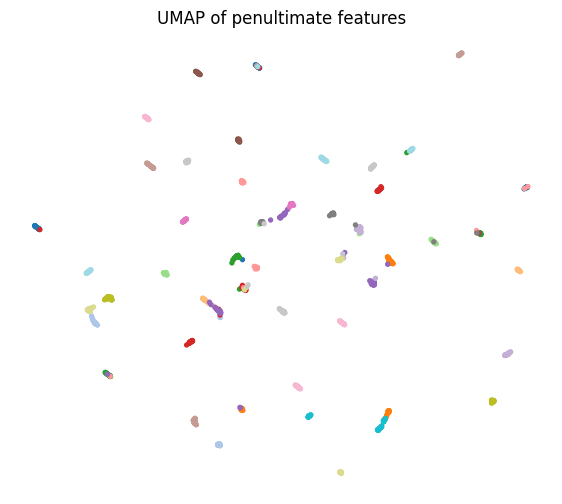

Points: 1540  | classes: 50


In [ ]:
# If needed: !pip -q install umap-learn
import numpy as np, umap, matplotlib.pyplot as plt, tensorflow as tf, os, glob
from tensorflow.keras.models import Model
from pathlib import Path

def find_penultimate_name(m):
    # Prefer GlobalAveragePooling, otherwise use the layer before the final Dense
    for L in reversed(m.layers):
        if "global_average_pooling" in L.name or isinstance(L, tf.keras.layers.GlobalAveragePooling2D):
            return L.name
    return m.layers[-2].name

feat_layer_name = find_penultimate_name(model)
feat_model = Model(inputs=model.input, outputs=model.get_layer(feat_layer_name).output)
print("Penultimate layer:", feat_layer_name, "| feature dim:", feat_model.output_shape[-1])

def collect_features_from_dir(root="split_data/test", class_names=None, limit_per_class=80):
    if class_names is None:
        class_names = sorted([p.name for p in Path(root).iterdir() if p.is_dir()])
    X, y = [], []
    for ci, cname in enumerate(class_names):
        paths = sorted(glob.glob(os.path.join(root, cname, "*.jpg")))[:limit_per_class]
        for p in paths:
            img = tf.image.decode_jpeg(tf.io.read_file(p), channels=3)
            img = tf.image.resize(img, (224,224))
            feat = feat_model(tf.cast(img[None,...], tf.float32), training=False).numpy()[0]
            X.append(feat); y.append(ci)
    return np.vstack(X), np.array(y)

X, y = collect_features_from_dir("split_data/test", CLASS_NAMES, limit_per_class=80)
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric="cosine", random_state=42)
Z = reducer.fit_transform(X)
plt.figure(figsize=(7,6)); plt.scatter(Z[:,0], Z[:,1], c=y, s=8, cmap="tab20")
plt.title("UMAP of penultimate features"); plt.axis("off"); plt.show()
print("Points:", len(X), " | classes:", len(CLASS_NAMES))


In [ ]:
import tensorflow as tf, numpy as np

def _cam_mask_uint8(img_u8, grad_model, top_frac=0.3):
    heat, _ = gradcam_for_tensor(img_u8, grad_model)                 # (h',w'), 0..1
    hm = tf.image.resize(heat[...,None], img_u8.shape[:2]).numpy().squeeze()
    thr = np.quantile(hm, 1.0 - top_frac)
    mask = (hm >= thr).astype(np.float32)                             # 1=foreground
    return mask

def _fast_blur(img_f32, k=15):
    # Simple box blur via avg pool; img_f32 in [0,255], shape (H,W,3)
    x = tf.expand_dims(img_f32, 0)                                    # (1,H,W,3)
    x = tf.nn.avg_pool(x, ksize=[1,k,k,1], strides=[1,1,1,1], padding='SAME')
    return tf.squeeze(x, 0)

def saliency_aware_ds(train_ds, grad_model, p=0.5, top_frac=0.3, mode="blur", k=15):
    """
    Wrap a tf.data.Dataset[(B,H,W,3),(B,C)] -> same shapes.
    With prob p per image, blur/cut the background (1 - CAM top_frac).
    """
    def gen():
        for images, labels in train_ds:
            imgs = images.numpy().astype('uint8')
            out = []
            for img in imgs:
                if np.random.rand() < p:
                    mask = _cam_mask_uint8(img, grad_model, top_frac)    # (H,W)
                    mask3 = np.repeat(mask[...,None], 3, axis=2).astype(np.float32)
                    img_f = tf.cast(img, tf.float32)
                    if mode == "blur":
                        bg = _fast_blur(img_f, k=k).numpy()
                        aug = img_f.numpy()*mask3 + bg*(1.0 - mask3)
                    elif mode == "cutout":
                        aug = img_f.numpy()*mask3                         # zero background
                    else:  # dim background
                        aug = img_f.numpy()* (0.3 + 0.7*mask3)
                    out.append(np.clip(aug, 0, 255).astype('uint8'))
                else:
                    out.append(img)
            yield tf.convert_to_tensor(np.stack(out), dtype=tf.float32), labels
    # infer shapes/dtypes from one batch
    s = next(iter(train_ds))[0].shape
    spec_x = tf.TensorSpec(shape=s, dtype=tf.float32)
    spec_y = next(iter(train_ds))[1].dtype
    return tf.data.Dataset.from_generator(gen, output_signature=(spec_x, tf.TensorSpec(shape=(s[0],labels.shape[-1]), dtype=spec_y)))



In [ ]:
import tensorflow as tf, numpy as np

def make_saliency_aware_ds(train_ds, grad_model, p=0.5, top_frac=0.3, mode="blur", k=15):
    # ---- infer shapes/dtypes from a sample ----
    sample_images, sample_labels = next(iter(train_ds))
    H, W, C = sample_images.shape[1:]

    # label layout: one-hot (B,C) or sparse (B,)
    is_one_hot = (sample_labels.ndim == 2 and sample_labels.shape[-1] > 1)
    if is_one_hot:
        num_classes = int(sample_labels.shape[-1])
        spec_y = tf.TensorSpec(shape=(None, num_classes), dtype=sample_labels.dtype)
    else:
        spec_y = tf.TensorSpec(shape=(None,), dtype=sample_labels.dtype)

    spec_x = tf.TensorSpec(shape=(None, H, W, C), dtype=tf.float32)

    # ---- inline Grad-CAM (no external deps) ----
    def _heatmap_uint8(img_u8):
        x = tf.cast(img_u8[None, ...], tf.float32)
        with tf.GradientTape() as tape:
            conv_out, preds = grad_model(x, training=False)
            idx = tf.argmax(preds[0])
            score = preds[:, idx]
        grads  = tape.gradient(score, conv_out)              # (1,hc,wc,C)
        pooled = tf.reduce_mean(grads, axis=(0,1,2))         # (C,)
        fmap   = conv_out[0]                                 # (hc,wc,C)
        cam    = tf.reduce_sum(fmap * pooled, axis=-1)       # (hc,wc)
        cam    = tf.nn.relu(cam)
        m = tf.reduce_max(cam)
        cam = (cam / m) if m > 0 else cam
        return tf.image.resize(cam[...,None], (H,W)).numpy().squeeze()

    def _fast_blur(img_f32, k=15):
        x = tf.expand_dims(img_f32, 0)
        x = tf.nn.avg_pool(x, ksize=[1,k,k,1], strides=[1,1,1,1], padding='SAME')
        return tf.squeeze(x, 0)

    def gen():
        for images, labels in train_ds:
            imgs = images.numpy().astype('uint8')
            out_imgs = []
            for img in imgs:
                if np.random.rand() < p:
                    hm   = _heatmap_uint8(img)
                    thr  = np.quantile(hm, 1.0 - top_frac)
                    mask = (hm >= thr).astype(np.float32)
                    mask3 = np.repeat(mask[...,None], 3, axis=2)

                    img_f = tf.cast(img, tf.float32)
                    if mode == "blur":
                        bg  = _fast_blur(img_f, k=k).numpy()
                        aug = img_f.numpy()*mask3 + bg*(1.0 - mask3)
                    elif mode == "cutout":
                        aug = img_f.numpy()*mask3
                    else:  # "dim"
                        aug = img_f.numpy()*(0.3 + 0.7*mask3)
                    out_imgs.append(np.clip(aug, 0, 255).astype('float32'))
                else:
                    out_imgs.append(tf.cast(img, tf.float32).numpy())

            y = labels.numpy()
            if not is_one_hot:
                y = y.reshape(-1)  # ensure (B,) for sparse

            yield np.stack(out_imgs, axis=0), y

    return tf.data.Dataset.from_generator(gen, output_signature=(spec_x, spec_y))


In [ ]:
aug_train_ds = make_saliency_aware_ds(train_ds, grad_model, p=0.5, top_frac=0.3, mode="blur", k=15)
aug_train_ds = aug_train_ds.prefetch(tf.data.AUTOTUNE)

model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss="categorical_crossentropy", metrics=["accuracy"])
hist = model.fit(aug_train_ds, validation_data=val_ds, epochs=2)


Epoch 1/2
    141/Unknown 3151s 22s/step - accuracy: 0.9698 - loss: 0.1334

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:160: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


141/141 ━━━━━━━━━━━━━━━━━━━━ 3241s 23s/step - accuracy: 0.9698 - loss: 0.1334 - val_accuracy: 0.9798 - val_loss: 0.0783
Epoch 2/2
141/141 ━━━━━━━━━━━━━━━━━━━━ 3288s 23s/step - accuracy: 0.9823 - loss: 0.0768 - val_accuracy: 0.9785 - val_loss: 0.0716


In [ ]:
# === SAVE & DOWNLOAD: model, metadata, and explainability figures ===
import os, json, zipfile, time, sys, pathlib, numpy as np, tensorflow as tf
from pathlib import Path

STAMP = time.strftime("%Y%m%d-%H%M%S")
ROOT = Path(f"ERP_export_{STAMP}")
ROOT.mkdir(exist_ok=True)

# -------------------------
# 1) Save model (.keras)
# -------------------------
MODEL_OUT = ROOT / f"model_{STAMP}.keras"
try:
    model.save(MODEL_OUT)
    print("Saved model ->", MODEL_OUT)
except Exception as e:
    print("Model save failed:", e)

# -------------------------
# 2) Save class names
# -------------------------
def infer_class_names(root="split_data/test"):
    p = Path(root)
    if p.exists():
        names = sorted([d.name for d in p.iterdir() if d.is_dir()])
        return names
    return []

if "CLASS_NAMES" in globals() and isinstance(CLASS_NAMES, (list, tuple)):
    class_names = list(CLASS_NAMES)
else:
    class_names = infer_class_names()
CLASS_JSON = ROOT / "class_names.json"
with open(CLASS_JSON, "w") as f:
    json.dump(class_names, f)
print("Saved class names ->", CLASS_JSON)

# -------------------------
# 3) Save config
# -------------------------
# Edit these if changed backbone or img size
config = {
    "backbone": "efficientnetb0",
    "last_conv": "block7a_project_conv",
    "img_size": [224, 224],
    "used_preprocess_input": False
}
CONF_JSON = ROOT / "config.json"
with open(CONF_JSON, "w") as f:
    json.dump(config, f, indent=2)
print("Saved config ->", CONF_JSON)

# -------------------------
# 4) Training history (if present)
# -------------------------
if "hist" in globals() and hasattr(hist, "history"):
    with open(ROOT / "train_history.json", "w") as f:
        json.dump(hist.history, f)
    print("Saved training history ->", ROOT / "train_history.json")
else:
    print("No `hist` found; skipping training history.")

# -------------------------
# 5) TTA numbers (if present)
# -------------------------
metrics = {}
if "BASE" in globals(): metrics["baseline_acc"] = float(BASE)
if "TTA"  in globals(): metrics["tta_acc"]      = float(TTA)
if metrics:
    with open(ROOT / "metrics.json", "w") as f:
        json.dump(metrics, f, indent=2)
    print("Saved metrics ->", ROOT / "metrics.json")
else:
    print("No TTA metrics found; skipping metrics.json.")

# -------------------------
# 6) UMAP coords (if present)
# -------------------------
if "Z" in globals() and isinstance(Z, np.ndarray):
    np.save(ROOT / "umap_Z.npy", Z)
    lab = None
    if "y" in globals() and isinstance(y, np.ndarray):
        np.save(ROOT / "umap_labels.npy", y)
    print("Saved UMAP arrays ->", ROOT / "umap_Z.npy")

# -------------------------
# 7) Zip Grad-CAM outputs (each folder separately to avoid giant zips)
# -------------------------
def zip_dir(src_dir: Path, out_zip: Path):
    if not src_dir.exists():
        return False
    with zipfile.ZipFile(out_zip, "w", compression=zipfile.ZIP_DEFLATED) as z:
        for root, _, files in os.walk(src_dir):
            for fn in files:
                fp = Path(root) / fn
                z.write(fp, arcname=str(Path(src_dir.name) / fp.relative_to(src_dir)))
    return True

ZIP_LIST = []
for dname in ["gradcam_examples", "gradcam_pairs", "gradcam_pairs_bicams"]:
    src = Path(dname)
    if src.exists():
        zpath = ROOT / f"{dname}_{STAMP}.zip"
        if zip_dir(src, zpath):
            ZIP_LIST.append(zpath)
            print("Zipped", dname, "->", zpath)
    else:
        print(f"Folder not found (skipping): {dname}")

# -------------------------
# 8) Small README with reload snippet
# -------------------------
readme = f"""How to reload (Colab):

from tensorflow.keras.models import load_model
import json, tensorflow as tf

# 1) load model
model = load_model("{MODEL_OUT.name}", compile=False)

# 2) class names
with open("{CLASS_JSON.name}") as f:
    CLASS_NAMES = json.load(f)

# 3) rebuild grad model
from tensorflow.keras.models import Model
def build_gradcam_model(model, backbone="{config['backbone']}", last_conv="{config['last_conv']}"):
    base = model.get_layer(backbone)
    conv = base.get_layer(last_conv).output
    x = base.output
    passed = False
    for l in model.layers:
        if not passed:
            passed = (l.name == backbone); continue
        x = l(x)
    return Model(inputs=base.input, outputs=[conv, x])

grad_model = build_gradcam_model(model)
print("Grad model ready.")
"""
with open(ROOT / "README_RELOAD.txt", "w") as f:
    f.write(readme)
print("Wrote reload instructions ->", ROOT / "README_RELOAD.txt")

# -------------------------
# 9) Make a tiny zip for core assets (model + jsons + README)
# -------------------------
CORE_ZIP = Path(f"core_assets_{STAMP}.zip")
with zipfile.ZipFile(CORE_ZIP, "w", compression=zipfile.ZIP_DEFLATED) as z:
    for p in [MODEL_OUT, CLASS_JSON, CONF_JSON, ROOT / "README_RELOAD.txt",
              ROOT / "train_history.json" if (ROOT / "train_history.json").exists() else None,
              ROOT / "metrics.json" if (ROOT / "metrics.json").exists() else None,
              ROOT / "umap_Z.npy" if (ROOT / "umap_Z.npy").exists() else None,
              ROOT / "umap_labels.npy" if (ROOT / "umap_labels.npy").exists() else None]:
        if p and Path(p).exists(): z.write(p, arcname=Path(p).name)

print("\nCreated:", CORE_ZIP)
print("Also created folder:", ROOT)
print("And CAM zips:", [p.name for p in ZIP_LIST] or "None")

# -------------------------
# 10) Trigger downloads (Colab); otherwise print paths
# -------------------------
try:
    from google.colab import files
    files.download(str(CORE_ZIP))
    for z in ZIP_LIST:
        files.download(str(z))
except Exception as e:
    print("\nDownload not available here; files are at:")
    print("  ", CORE_ZIP.resolve())
    for z in ZIP_LIST:
        print("  ", z.resolve())


Saved model -> ERP_export_20250816-145211/model_20250816-145211.keras
Saved class names -> ERP_export_20250816-145211/class_names.json
Saved config -> ERP_export_20250816-145211/config.json
Saved training history -> ERP_export_20250816-145211/train_history.json
Saved metrics -> ERP_export_20250816-145211/metrics.json
Saved UMAP arrays -> ERP_export_20250816-145211/umap_Z.npy
Folder not found (skipping): gradcam_examples
Folder not found (skipping): gradcam_pairs
Folder not found (skipping): gradcam_pairs_bicams
Wrote reload instructions -> ERP_export_20250816-145211/README_RELOAD.txt

Created: core_assets_20250816-145211.zip
Also created folder: ERP_export_20250816-145211
And CAM zips: None


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# === Robust reload: model + class names + config + grad_model ===
import os, glob, json, zipfile
from pathlib import Path
from tensorflow.keras.models import load_model, Model

# 0) If a core_assets zip is present, extract it to a temp folder
zips = sorted(glob.glob("core_assets_*.zip"))
extract_root = Path("core_assets_extracted")
if zips:
    extract_root.mkdir(exist_ok=True)
    with zipfile.ZipFile(zips[-1]) as z:
        z.extractall(extract_root)
    print("Extracted:", zips[-1], "->", extract_root)

# 1) Find model (.keras) anywhere
keras_candidates = (
    glob.glob("*.keras")
    + glob.glob(str(extract_root / "**" / "*.keras"), recursive=True)
)
assert keras_candidates, "No .keras model file found. Make sure you unzipped or uploaded it."
MODEL_PATH = sorted(keras_candidates)[-1]
print("Loading model from:", MODEL_PATH)
model = load_model(MODEL_PATH, compile=False)

# 2) Load class_names.json if present; else infer from split_data/test
json_candidates = (
    glob.glob("class_names.json")
    + glob.glob(str(extract_root / "**" / "class_names.json"), recursive=True)
)
if json_candidates:
    with open(sorted(json_candidates)[-1]) as f:
        CLASS_NAMES = json.load(f)
    print("Loaded class names from JSON:", len(CLASS_NAMES))
else:
    test_root = Path("split_data/test")
    if test_root.exists():
        CLASS_NAMES = sorted([p.name for p in test_root.iterdir() if p.is_dir()])
        print("Inferred class names from folder:", len(CLASS_NAMES))
    else:
        CLASS_NAMES = []
        print("No class_names.json and no split_data/test — continuing without labels.")

# 3) Load config.json if present; else use sensible defaults
cfg_candidates = (
    glob.glob("config.json")
    + glob.glob(str(extract_root / "**" / "config.json"), recursive=True)
)
if cfg_candidates:
    with open(sorted(cfg_candidates)[-1]) as f:
        cfg = json.load(f)
else:
    cfg = {"backbone": "efficientnetb0", "last_conv": "block7a_project_conv", "img_size": [224,224], "used_preprocess_input": False}
print("Config:", cfg)

# 4) Rebuild Grad-CAM model from config
def build_gradcam_model(model, backbone=None, last_conv=None):
    backbone = backbone or cfg["backbone"]
    last_conv = last_conv or cfg["last_conv"]
    base = model.get_layer(backbone)
    conv = base.get_layer(last_conv).output
    x = base.output
    passed = False
    for l in model.layers:
        if not passed:
            passed = (l.name == backbone); continue
        x = l(x)   # reuse existing head layers
    return Model(inputs=base.input, outputs=[conv, x])

grad_model = build_gradcam_model(model)
print("Grad model ready:", grad_model.input_shape, "->", grad_model.output_shape)



Extracted: core_assets_20250816-145211.zip -> core_assets_extracted
Loading model from: efficientnet_b0_finetuned_final.keras
Loaded class names from JSON: 50
Config: {'backbone': 'efficientnetb0', 'last_conv': 'block7a_project_conv', 'img_size': [224, 224], 'used_preprocess_input': False}
Grad model ready: (None, 224, 224, 3) -> [(None, 7, 7, 320), (None, 50)]


In [ ]:
# --- Minimal Grad-CAM helper (works with existing grad_model) ---
import tensorflow as tf, numpy as np

def gradcam_for_tensor(img_uint8, grad_model, keep_index=None, preprocess_fn=None):
    """
    img_uint8: (H,W,3) uint8 in [0,255]
    keep_index: if given, compute CAM for this class index; otherwise use argmax(pred)
    returns: (heatmap[0..1], pred_idx)
    """
    x = tf.cast(img_uint8[None, ...], tf.float32)
    if preprocess_fn is not None:
        x = preprocess_fn(x)

    with tf.GradientTape() as tape:
        conv_out, preds = grad_model(x, training=False)                # conv_out: (1,hc,wc,C)
        pred_idx = tf.argmax(preds[0]) if keep_index is None else tf.convert_to_tensor(keep_index)
        class_score = preds[:, pred_idx]

    grads  = tape.gradient(class_score, conv_out)                      # (1,hc,wc,C)
    pooled = tf.reduce_mean(grads, axis=(0,1,2))                       # (C,)
    fmap   = conv_out[0]                                               # (hc,wc,C)
    cam    = tf.reduce_sum(fmap * pooled, axis=-1)                     # (hc,wc)
    cam    = tf.nn.relu(cam)
    m = tf.reduce_max(cam)
    cam    = (cam / m) if m > 0 else cam
    return cam.numpy(), int(pred_idx.numpy())


Misclassified available: 101; using 80
Correct sampled: 80


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_1']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


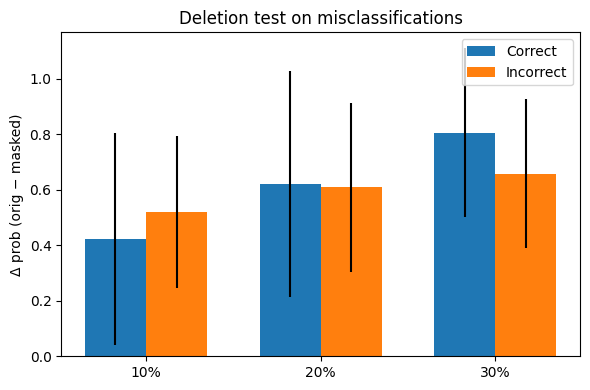

Correct:
  top 10%: mean=0.422 ± 0.381 (n=80)
  top 20%: mean=0.620 ± 0.407 (n=80)
  top 30%: mean=0.806 ± 0.306 (n=80)
Incorrect:
  top 10%: mean=0.520 ± 0.274 (n=80)
  top 20%: mean=0.609 ± 0.303 (n=80)
  top 30%: mean=0.658 ± 0.267 (n=80)


In [ ]:
_ = deletion_test_misclassified(n_max=80, fracs=(0.1, 0.2, 0.3))


In [ ]:
# Grad-CAM++ helper (self-contained)
import tensorflow as tf

def gradcampp_for_tensor(img_uint8, grad_model, keep_index=None, preprocess_fn=None):
    """
    Compute Grad-CAM++ for a single uint8 image using your existing grad_model.
    Returns (heatmap[0..1], class_index_used).
    """
    x = tf.cast(img_uint8[None, ...], tf.float32)
    if preprocess_fn is not None:
        x = preprocess_fn(x)

    # two nested tapes not strictly required in TF2 eager, but harmless
    with tf.GradientTape() as tape:
        conv_out, preds = grad_model(x, training=False)      # conv_out: (1,Hc,Wc,C)
        k = tf.argmax(preds[0]) if keep_index is None else tf.convert_to_tensor(keep_index)
        score = preds[:, k]

    grads  = tape.gradient(score, conv_out)                  # (1,Hc,Wc,C)
    grads2 = grads * grads
    grads3 = grads2 * grads
    A = conv_out

    eps = 1e-7
    alpha_num = grads2
    alpha_den = 2.0 * grads2 + A * grads3 + eps
    alphas = alpha_num / alpha_den                           # (1,Hc,Wc,C)

    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(1,2))  # (1,C)
    cam = tf.reduce_sum(weights[:, None, None, :] * A, axis=-1)      # (1,Hc,Wc)

    cam = tf.nn.relu(cam)[0]
    m = tf.reduce_max(cam)
    cam = cam / m if m > 0 else cam
    return cam.numpy(), int(k.numpy())



In [ ]:
# --- Minimal overlay helper (same behavior as before) ---
import numpy as np, tensorflow as tf
import matplotlib.pyplot as plt

def overlay(img_uint8, heatmap, alpha=0.35, cmap='jet'):
    """Blend a [0..1] heatmap onto a uint8 image and return an RGB float image [0..1]."""
    import matplotlib.cm as cm
    H, W = img_uint8.shape[:2]
    hm = tf.image.resize(heatmap[..., None], (H, W)).numpy().squeeze()
    hm_rgb = cm.get_cmap(cmap)(hm)[..., :3]                 # (H,W,3) in [0,1]
    img = img_uint8.astype("float32") / 255.0               # (H,W,3) in [0,1]
    out = np.clip((1 - alpha) * img + alpha * hm_rgb, 0, 1) # blended
    return out


In [ ]:
pick_heroes()


/tmp/ipython-input-2131089460.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  hm_rgb = cm.get_cmap(cmap)(hm)[..., :3]                 # (H,W,3) in [0,1]


Wrote report_figs/hero_correct.png
Wrote report_figs/hero_incorrect.png


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_1']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)
/tmp/ipython-input-2371793239.py:47: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  auc = np.trapz(drops, x=list(steps)) / steps[-1]
/tmp/ipython-input-2371793239.py:72: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([auc_cor, auc_mis], labels=["Correct","Incorrect"], showmeans=True)


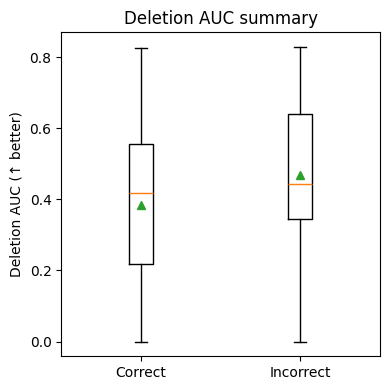

Deletion AUC — Correct: 0.384±0.226 (n=80)
Deletion AUC — Incorrect: 0.468±0.200 (n=80)


In [ ]:
import os, glob, numpy as np, tensorflow as tf, matplotlib.pyplot as plt
from pathlib import Path

IMG_SIZE = (224,224)

def _load_u8(p):
    img = tf.image.decode_jpeg(tf.io.read_file(p), 3)
    img = tf.image.resize(img, IMG_SIZE)
    return tf.cast(tf.clip_by_value(img,0,255), tf.uint8).numpy()

def _cam(img_u8):
    # use helper if present; otherwise inline Grad-CAM
    if 'gradcam_for_tensor' in globals():
        return gradcam_for_tensor(img_u8, grad_model)[0]
    x = tf.cast(img_u8[None,...], tf.float32)
    with tf.GradientTape() as tape:
        conv, preds = grad_model(x, training=False)
        k = tf.argmax(preds[0]); score = preds[:,k]
    g = tape.gradient(score, conv); w = tf.reduce_mean(g, axis=(0,1,2))
    cam = tf.reduce_sum(conv[0]*w, axis=-1); cam = tf.nn.relu(cam)
    m = tf.reduce_max(cam); cam = cam/m if m>0 else cam
    return cam.numpy()

def _collect(root="split_data/test", class_names=None):
    if class_names is None:
        class_names = sorted([d.name for d in Path(root).iterdir() if d.is_dir()])
    files, y = [], []
    for c in class_names:
        ps = sorted(glob.glob(os.path.join(root,c,"*.jpg")))
        files += ps; y += [class_names.index(c)]*len(ps)
    return files, np.array(y), class_names

def deletion_auc_per_image(img_u8, keep_idx, steps=(0.05,0.10,0.15,0.20,0.25,0.30)):
    x = tf.cast(img_u8[None,...], tf.float32)
    p0 = model(x, training=False).numpy()[0][keep_idx]
    cam = _cam(img_u8)
    hm = tf.image.resize(cam[...,None], IMG_SIZE).numpy().squeeze()
    drops = []
    for f in steps:
        thr = np.quantile(hm, 1.0 - f)
        mask = hm >= thr
        x_del = x.numpy()
        x_del[0][mask] = 0
        p1 = model(x_del, training=False).numpy()[0][keep_idx]
        drops.append(float(p0 - p1))
    # trapezoidal area normalized to [0,1] by dividing by (max_f * p0 if desired); here just mean
    auc = np.trapz(drops, x=list(steps)) / steps[-1]
    return auc, drops

def deletion_auc_summary(root="split_data/test", n_max=80):
    files, y_true, _ = _collect(root, CLASS_NAMES)
    preds, conf = [], []
    for p in files:
        xi = tf.cast(_load_u8(p)[None,...], tf.float32)
        pr = model(xi, training=False).numpy()[0]
        preds.append(int(np.argmax(pr))); conf.append(float(pr.max()))
    preds, conf = np.array(preds), np.array(conf)

    mis = np.where(preds!=y_true)[0][:n_max]
    cor = np.where(preds==y_true)[0][:min(n_max, np.sum(preds==y_true))]

    def gather(ix):
        aucs=[]
        for i in ix:
            img = _load_u8(files[i])
            auc,_ = deletion_auc_per_image(img, keep_idx=preds[i])
            aucs.append(auc)
        return np.array(aucs)

    auc_cor = gather(cor); auc_mis = gather(mis)
    plt.figure(figsize=(4,4))
    plt.boxplot([auc_cor, auc_mis], labels=["Correct","Incorrect"], showmeans=True)
    plt.ylabel("Deletion AUC (↑ better)"); plt.title("Deletion AUC summary")
    plt.tight_layout(); plt.show()
    print(f"Deletion AUC — Correct: {auc_cor.mean():.3f}±{auc_cor.std():.3f} (n={len(auc_cor)})")
    print(f"Deletion AUC — Incorrect: {auc_mis.mean():.3f}±{auc_mis.std():.3f} (n={len(auc_mis)})")
    return auc_cor, auc_mis

_ = deletion_auc_summary(n_max=80)


In [ ]:
import numpy as np, tensorflow as tf, glob, os
from pathlib import Path

def blur_background(img_u8, top_frac=0.3, k=15):
    cam = _cam(img_u8)
    hm = tf.image.resize(cam[...,None], IMG_SIZE).numpy().squeeze()
    thr = np.quantile(hm, 1.0 - top_frac)
    fg  = (hm >= thr).astype(np.float32)
    fg3 = np.repeat(fg[...,None],3,axis=2)
    x = tf.cast(img_u8, tf.float32)
    # simple box blur = avg pool
    b = tf.nn.avg_pool(x[None,...], ksize=[1,k,k,1], strides=[1,1,1,1], padding='SAME')[0]
    out = x*fg3 + b*(1.0-fg3)
    return tf.cast(tf.clip_by_value(out,0,255), tf.uint8).numpy()

def accuracy_delta_with_bg_blur(root="split_data/test", top_frac=0.3):
    files, y_true, _ = _collect(root, CLASS_NAMES)
    base_correct=0; blur_correct=0
    for p,t in zip(files,y_true):
        img = _load_u8(p)
        xb = tf.cast(img[None,...], tf.float32)
        pred_base = int(np.argmax(model(xb, training=False).numpy()[0]))
        base_correct += (pred_base==t)

        img_blur = blur_background(img, top_frac=top_frac)
        xb2 = tf.cast(img_blur[None,...], tf.float32)
        pred_blur = int(np.argmax(model(xb2, training=False).numpy()[0]))
        blur_correct += (pred_blur==t)

    n = len(files)
    acc_base = base_correct/n; acc_blur = blur_correct/n
    print(f"Accuracy (base): {acc_base:.3f} | (BG-blurred): {acc_blur:.3f} | Δ={acc_blur-acc_base:+.3f}")
    return acc_base, acc_blur

_ = accuracy_delta_with_bg_blur(top_frac=0.3)


Accuracy (base): 0.934 | (BG-blurred): 0.851 | Δ=-0.084


/tmp/ipython-input-2131089460.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  hm_rgb = cm.get_cmap(cmap)(hm)[..., :3]                 # (H,W,3) in [0,1]


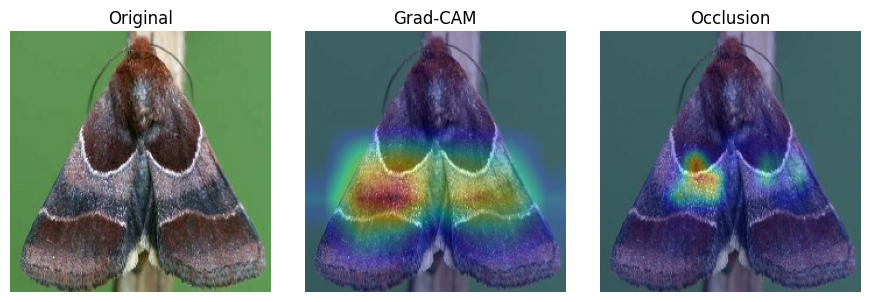

In [ ]:
import numpy as np, tensorflow as tf, matplotlib.pyplot as plt, glob

def occlusion_map(img_u8, patch=32, stride=16, keep_idx=None):
    x0 = tf.cast(img_u8[None,...], tf.float32)
    probs0 = model(x0, training=False).numpy()[0]
    k = int(np.argmax(probs0)) if keep_idx is None else int(keep_idx)
    base = float(probs0[k])

    H,W,_ = img_u8.shape
    grid_h = 1 + (H - patch) // stride
    grid_w = 1 + (W - patch) // stride
    heat = np.zeros((grid_h, grid_w), dtype=np.float32)

    for i, y in enumerate(range(0, H - patch + 1, stride)):
        for j, x in enumerate(range(0, W - patch + 1, stride)):
            mod = img_u8.copy()
            mod[y:y+patch, x:x+patch] = 0
            p = model(tf.cast(mod[None,...], tf.float32), training=False).numpy()[0][k]
            heat[i,j] = base - float(p)  # drop when region is occluded

    # upsample to full image for display
    heat_full = tf.image.resize(heat[...,None], (H,W)).numpy().squeeze()
    heat_full = np.maximum(0, heat_full/ (heat_full.max()+1e-6))
    return heat_full, k

# run on one test image
sample_path = sorted(glob.glob("split_data/test/*/*.jpg"))[0]
img = _load_u8(sample_path)
occ, k = occlusion_map(img, patch=28, stride=14)
plt.figure(figsize=(9,3))
plt.subplot(1,3,1); plt.imshow(img); plt.title("Original"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(overlay(img, _cam(img))); plt.title("Grad-CAM"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(overlay(img, occ)); plt.title("Occlusion"); plt.axis('off')
plt.tight_layout(); plt.show()


In [ ]:
def deletion_auc_per_image_true(img_u8, true_idx, steps=(0.1,0.2,0.3)):
    x = tf.cast(img_u8[None,...], tf.float32)
    p0 = float(model(x, training=False).numpy()[0][true_idx])
    cam = _cam(img_u8)
    hm  = tf.image.resize(cam[...,None], (224,224)).numpy().squeeze()
    drops=[]
    for f in steps:
        thr=np.quantile(hm,1.0-f); mask=hm>=thr
        x_del=x.numpy(); x_del[0][mask]=0
        p1=float(model(x_del, training=False).numpy()[0][true_idx])
        drops.append(p0-p1)
    return np.trapz(drops, x=list(steps))/steps[-1]

def deletion_auc_summary_true(root="split_data/test", n_max=80):
    files, y_true, _ = _collect(root, CLASS_NAMES)
    import numpy as np
    sel = np.random.choice(len(files), size=min(n_max, len(files)), replace=False)
    aucs_cor, aucs_err = [], []
    for i in sel:
        img = _load_u8(files[i])
        # correctness for grouping only
        pred = int(np.argmax(model(tf.cast(img[None,...], tf.float32), training=False).numpy()[0]))
        auc  = deletion_auc_per_image_true(img, true_idx=int(y_true[i]))
        (aucs_cor if pred==y_true[i] else aucs_err).append(auc)
    print(f"True-class Deletion AUC — Correct:   {np.mean(aucs_cor):.3f}±{np.std(aucs_cor):.3f} (n={len(aucs_cor)})")
    print(f"True-class Deletion AUC — Incorrect: {np.mean(aucs_err):.3f}±{np.std(aucs_err):.3f} (n={len(aucs_err)})")


deletion_auc_summary_true(n_max=80)


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_1']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)
/tmp/ipython-input-1015289099.py:12: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return np.trapz(drops, x=list(steps))/steps[-1]


True-class Deletion AUC — Correct:   0.369±0.207 (n=79)
True-class Deletion AUC — Incorrect: -0.188±0.000 (n=1)


Accuracy (base): 0.934 | (BG-blurred): 0.773 | Δ=-0.161
Accuracy (base): 0.934 | (BG-blurred): 0.851 | Δ=-0.084
Accuracy (base): 0.934 | (BG-blurred): 0.885 | Δ=-0.049


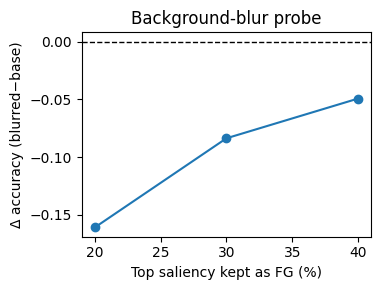

In [ ]:
def bg_blur_sweep(fracs=(0.2,0.3,0.4)):
    base, deltas = None, []
    for f in fracs:
        acc_b, acc_blur = accuracy_delta_with_bg_blur(top_frac=f)
        base = acc_b if base is None else base
        deltas.append(acc_blur-acc_b)
    import matplotlib.pyplot as plt
    xs=[int(100*x) for x in fracs]
    plt.figure(figsize=(4,3))
    plt.plot(xs, deltas, marker='o'); plt.axhline(0,color='k',ls='--',lw=1)
    plt.xlabel("Top saliency kept as FG (%)"); plt.ylabel("Δ accuracy (blurred−base)")
    plt.title("Background-blur probe"); plt.tight_layout(); plt.show()

bg_blur_sweep()


Baseline calibration on TEST


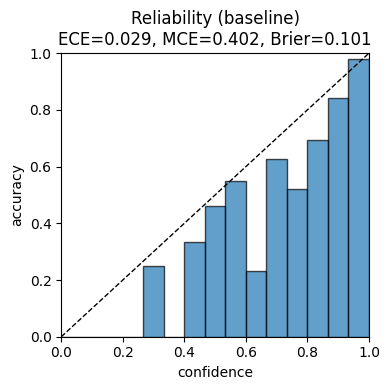

Best temperature on VAL: T* = 1.350 (NLL=0.2306)
Calibrated (temperature-scaled) on TEST


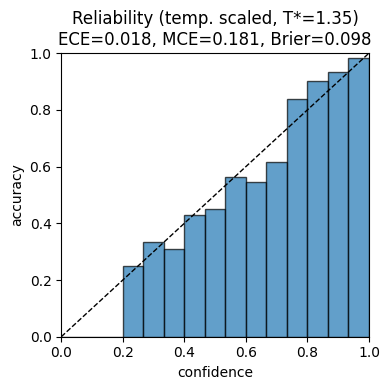

Accuracy baseline: 0.934 | after T-scale: 0.934
ECE: 0.029 → 0.018 | MCE: 0.402 → 0.181 | Brier: 0.101 → 0.098


In [ ]:
import os, glob, numpy as np, matplotlib.pyplot as plt, tensorflow as tf
from pathlib import Path

# ---------- data utils ----------
def collect_probs_labels(model, root="split_data/test", class_names=None, limit=None):
    if class_names is None:
        class_names = sorted([d for d in os.listdir(root) if os.path.isdir(os.path.join(root, d))])
    files, y = [], []
    for c in class_names:
        ps = sorted(glob.glob(os.path.join(root, c, "*.jpg")))
        if limit: ps = ps[:limit]
        files += ps; y += [class_names.index(c)] * len(ps)
    probs = []
    for p in files:
        img = _load_u8(p)                       # existing 224x224 uint8 loader
        x = tf.cast(img[None, ...], tf.float32)
        probs.append(model(x, training=False).numpy()[0])
    return np.vstack(probs), np.array(y)

# ---------- calibration metrics ----------
def reliability_ece(probs, y, n_bins=15, plot=True, title="Reliability diagram"):
    conf = probs.max(axis=1)
    pred = probs.argmax(axis=1)
    acc  = (pred == y).astype(float)
    bins = np.linspace(0, 1, n_bins + 1)
    bin_acc, bin_conf, bin_frac = [], [], []
    for i in range(n_bins):
        m = (conf > bins[i]) & (conf <= bins[i+1])
        if m.sum() == 0:
            bin_acc.append(np.nan); bin_conf.append(np.nan); bin_frac.append(0.0)
        else:
            bin_acc.append(acc[m].mean()); bin_conf.append(conf[m].mean()); bin_frac.append(m.mean())
    # ECE (weighted L1 gap), MCE (max gap)
    gaps = [abs(a - c) for a, c in zip(bin_acc, bin_conf) if not np.isnan(a)]
    weights = [f for a, f in zip(bin_acc, bin_frac) if not np.isnan(a)]
    ece = float(np.sum(np.array(gaps) * np.array(weights)))
    mce = float(np.max(gaps)) if gaps else np.nan
    # Brier score
    onehot = np.eye(probs.shape[1])[y]
    brier = float(np.mean(np.sum((probs - onehot)**2, axis=1)))

    if plot:
        xs = 0.5 * (bins[1:] + bins[:-1])
        w  = 1.0 / n_bins
        plt.figure(figsize=(4,4))
        plt.bar(xs, [0 if np.isnan(a) else a for a in bin_acc], width=w, label="accuracy", alpha=0.7, edgecolor='k')
        plt.plot([0,1],[0,1],'--',c='k',lw=1)
        plt.ylim(0,1); plt.xlim(0,1)
        plt.xlabel("confidence"); plt.ylabel("accuracy")
        plt.title(f"{title}\nECE={ece:.3f}, MCE={mce:.3f}, Brier={brier:.3f}")
        plt.tight_layout(); plt.show()
    return ece, mce, brier

# ---------- temperature scaling (optional) ----------
def softmax_T(probs, T=1.0, eps=1e-12):
    """Scale *probabilities* by T via log-space: softmax(log(p)/T)."""
    logits = np.log(np.clip(probs, eps, 1.0))
    z = logits / float(T)
    z -= z.max(axis=1, keepdims=True)
    ez = np.exp(z)
    return ez / ez.sum(axis=1, keepdims=True)

def fit_temperature_on_val(probs_val, y_val, T_grid=None):
    """Choose T minimizing NLL on validation probabilities."""
    if T_grid is None:
        T_grid = np.concatenate([
            np.linspace(0.5, 1.5, 21),
            np.linspace(1.6, 3.0, 15)
        ])
    best_T, best_nll = None, np.inf
    for T in T_grid:
        pT = softmax_T(probs_val, T)
        nll = -np.log(np.take_along_axis(pT, y_val[:,None], axis=1)).mean()
        if nll < best_nll:
            best_nll, best_T = nll, T
    return float(best_T), float(best_nll)

# ---------- run: baseline + (optional) temperature scaling ----------
# Choose roots (fallback to test if don't have a val split)
val_root  = "split_data/val"  if Path("split_data/val").exists()  else "split_data/test"
test_root = "split_data/test"

print("Collecting probabilities…")
probs_val, y_val   = collect_probs_labels(model, val_root,  CLASS_NAMES, limit=None)
probs_test, y_test = collect_probs_labels(model, test_root, CLASS_NAMES, limit=None)

print("Baseline calibration on TEST")
ece0, mce0, brier0 = reliability_ece(probs_test, y_test, n_bins=15, plot=True, title="Reliability (baseline)")

# Fit temperature on *validation*, apply to *test*
T_star, nll_val = fit_temperature_on_val(probs_val, y_val)
print(f"Best temperature on VAL: T* = {T_star:.3f} (NLL={nll_val:.4f})")

probs_test_T = softmax_T(probs_test, T_star)

print("Calibrated (temperature-scaled) on TEST")
eceT, mceT, brierT = reliability_ece(probs_test_T, y_test, n_bins=15, plot=True,
                                     title=f"Reliability (temp. scaled, T*={T_star:.2f})")

# Accuracy check (should be ~unchanged)
acc0 = (probs_test.argmax(axis=1) == y_test).mean()
accT = (probs_test_T.argmax(axis=1) == y_test).mean()
print(f"Accuracy baseline: {acc0:.3f} | after T-scale: {accT:.3f}")
print(f"ECE: {ece0:.3f} → {eceT:.3f} | MCE: {mce0:.3f} → {mceT:.3f} | Brier: {brier0:.3f} → {brierT:.3f}")


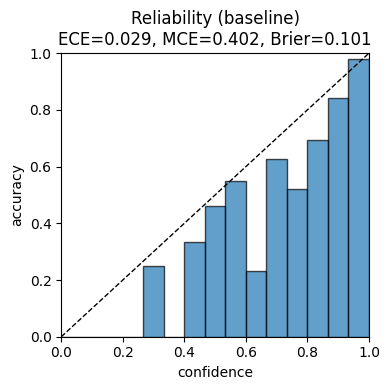

<Figure size 640x480 with 0 Axes>

In [ ]:
# Save baseline plot
_ = reliability_ece(probs_test, y_test, 15, True, "Reliability (baseline)"); plt.gcf().savefig("reliability_baseline.png", dpi=200)

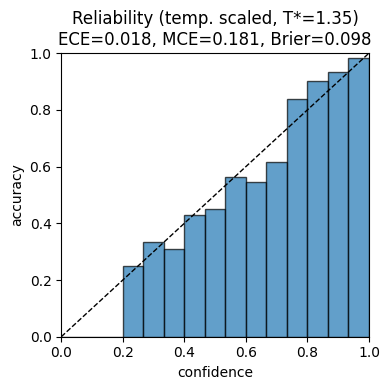

<Figure size 640x480 with 0 Axes>

In [ ]:
# Save calibrated plot + metrics JSON
eceT,mceT,brierT = reliability_ece(probs_test_T, y_test, 15, True, f"Reliability (temp. scaled, T*={T_star:.2f})"); plt.gcf().savefig("reliability_temp_scaled.png", dpi=200); import json; json.dump({"T_star":float(T_star),"acc_base":float(acc0),"acc_temp":float(accT),"ECE_base":float(ece0),"ECE_temp":float(eceT),"MCE_base":float(mce0),"MCE_temp":float(mceT),"Brier_base":float(brier0),"Brier_temp":float(brierT)}, open("calibration_metrics.json","w"), indent=2)


In [ ]:
# Per-class metrics + confusion matrix (CSV + PNG)
import numpy as np, matplotlib.pyplot as plt, seaborn as sns, json, os, glob, tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix

def _load_u8(p):
    img=tf.image.decode_jpeg(tf.io.read_file(p),3); img=tf.image.resize(img,(224,224))
    return tf.cast(tf.clip_by_value(img,0,255),tf.uint8).numpy()

def collect_probs_labels(model, root="split_data/test", class_names=None):
    if class_names is None:
        class_names=sorted([d for d in os.listdir(root) if os.path.isdir(os.path.join(root,d))])
    files,y=[],[]
    for c in class_names:
        ps=sorted(glob.glob(os.path.join(root,c,"*.jpg")))
        files+=ps; y+=[class_names.index(c)]*len(ps)
    probs=[]
    for p in files:
        x=tf.cast(_load_u8(p)[None,...], tf.float32)
        probs.append(model(x, training=False).numpy()[0])
    return np.vstack(probs), np.array(y)

# use calibrated probs if wanted (probs_test_T); otherwise compute fresh:
probs, y = collect_probs_labels(model, "split_data/test", CLASS_NAMES)
pred = probs.argmax(axis=1)

# report
rep = classification_report(y, pred, target_names=CLASS_NAMES, output_dict=True, zero_division=0)
import pandas as pd
pd.DataFrame(rep).T.to_csv("per_class_report.csv")

# confusion matrix (row-normalized)
cm = confusion_matrix(y, pred, labels=range(len(CLASS_NAMES)))
cmn = cm / cm.sum(axis=1, keepdims=True)
plt.figure(figsize=(8,6))
sns.heatmap(cmn, cmap="Blues", xticklabels=False, yticklabels=False, cbar=True)
plt.title("Confusion matrix (row-normalized)"); plt.tight_layout(); plt.savefig("confusion_matrix.png", dpi=200); plt.close()
print("Wrote per_class_report.csv and confusion_matrix.png")


Wrote per_class_report.csv and confusion_matrix.png


In [ ]:
import numpy as np, matplotlib.pyplot as plt

# if already have: probs_test_T (temp-scaled) and y_test — use them.
probs_eval = probs_test_T if 'probs_test_T' in globals() else probs
y_eval = y_test if 'y_test' in globals() else y

conf = probs_eval.max(axis=1)
pred = probs_eval.argmax(axis=1)
correct = (pred==y_eval).astype(int)

taus = np.linspace(0.0, 0.99, 25)
accs, cover = [], []
for t in taus:
    keep = conf >= t
    cover.append(keep.mean())
    accs.append(correct[keep].mean() if keep.any() else np.nan)

plt.figure(figsize=(5,3.5))
plt.plot(cover, accs, marker='o'); plt.xlabel("coverage"); plt.ylabel("accuracy"); plt.title("Select-ive accuracy vs coverage")
plt.tight_layout(); plt.savefig("coverage_accuracy_curve.png", dpi=200); plt.close()
print("Saved coverage_accuracy_curve.png")

# example operating point: choose τ that gives ~95% coverage
target = 0.95
i = np.argmin(np.abs(np.array(cover) - target))
print(f"τ≈{taus[i]:.2f} → coverage={cover[i]:.3f}, accuracy={accs[i]:.3f}")


Saved coverage_accuracy_curve.png
τ≈0.62 → coverage=0.949, accuracy=0.963


Evaluating on 1540 test images across 50 classes…
Baseline accuracy: 0.934
JPEG q= 90: acc=0.928  Δ=-0.006
JPEG q= 60: acc=0.906  Δ=-0.028
JPEG q= 30: acc=0.897  Δ=-0.037
Noise σ=8 : acc=0.894  Δ=-0.040
Noise σ=16: acc=0.812  Δ=-0.122
Noise σ=32: acc=0.596  Δ=-0.338
Blur k=3,σ=0.8: acc=0.917  Δ=-0.018
Blur k=7,σ=1.5: acc=0.817  Δ=-0.118
Blur k=11,σ=2.0: acc=0.740  Δ=-0.195


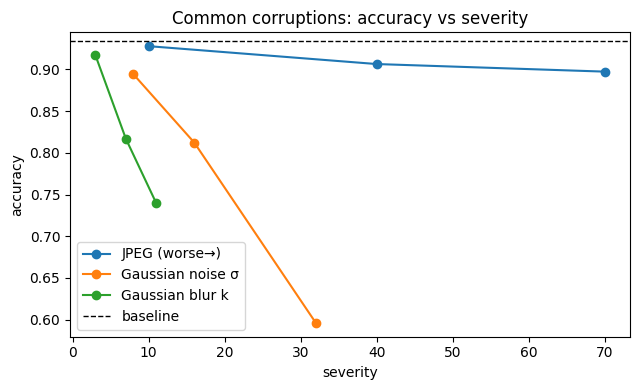

In [ ]:
# --- Quick robustness sweep: JPEG, Gaussian noise, Gaussian blur ---
import os, glob, numpy as np, matplotlib.pyplot as plt, tensorflow as tf
from pathlib import Path

IMG_SIZE = (224, 224)
TEST_ROOT = "split_data/test"

# Fallbacks in case they aren't defined in this session
if 'CLASS_NAMES' not in globals():
    CLASS_NAMES = sorted([p.name for p in Path(TEST_ROOT).iterdir() if p.is_dir()])
def _load_u8(p):
    img = tf.image.decode_jpeg(tf.io.read_file(p), 3)
    img = tf.image.resize(img, IMG_SIZE)
    return tf.cast(tf.clip_by_value(img, 0, 255), tf.uint8).numpy()

# ---------- corruptions ----------
def corrupt_jpeg(u8, quality):
    """Re-encode at lower quality (1..100)."""
    b = tf.io.encode_jpeg(u8, format='rgb', quality=int(quality))
    return tf.io.decode_jpeg(b, channels=3).numpy()

def corrupt_noise(u8, sigma):
    x = tf.cast(u8, tf.float32) + tf.random.normal(tf.shape(u8), stddev=float(sigma))
    return tf.cast(tf.clip_by_value(x, 0, 255), tf.uint8).numpy()

def _gaussian_kernel(ks, sigma):
    ax = tf.range(ks, dtype=tf.float32) - (ks - 1.)/2.
    k1d = tf.exp(-0.5*(ax/sigma)**2)
    k1d = k1d / tf.reduce_sum(k1d)
    k2d = tf.tensordot(k1d, k1d, axes=0)
    k2d = k2d / tf.reduce_sum(k2d)
    # depthwise filter: [kh, kw, in_channels, channel_multiplier]
    ker = k2d[:, :, None, None]
    ker = tf.repeat(ker, repeats=3, axis=2)
    return ker

def corrupt_blur(u8, ks, sigma):
    x = tf.cast(u8, tf.float32) / 255.0
    x4 = tf.expand_dims(x, 0)
    ker = _gaussian_kernel(int(ks), float(sigma))
    y = tf.nn.depthwise_conv2d(x4, ker, strides=[1,1,1,1], padding='SAME')
    y = tf.squeeze(y, 0) * 255.0
    return tf.cast(tf.clip_by_value(y, 0, 255), tf.uint8).numpy()

# ---------- evaluation ----------
def list_test_files(root=TEST_ROOT, class_names=None, limit_per_class=None):
    if class_names is None:
        class_names = sorted([d for d in os.listdir(root) if os.path.isdir(os.path.join(root, d))])
    files, y = [], []
    for c in class_names:
        ps = sorted(glob.glob(os.path.join(root, c, "*.jpg")))
        if limit_per_class: ps = ps[:limit_per_class]
        files += ps; y += [class_names.index(c)] * len(ps)
    return files, np.array(y)

def accuracy_on_files(files, y_true, corrupt=None):
    correct = 0
    for p, t in zip(files, y_true):
        img = _load_u8(p)
        if corrupt is not None:
            img = corrupt(img)
        logits = model(tf.cast(img[None,...], tf.float32), training=False).numpy()[0]
        pred = int(np.argmax(logits))
        correct += (pred == t)
    return correct / len(files)

# Severities (tweak if desired)
jpeg_qualities = [90, 60, 30]         # lower = worse
noise_sigmas   = [8, 16, 32]          # pixel stddev
blur_levels    = [(3,0.8), (7,1.5), (11,2.0)]  # (kernel, sigma)

# Gather
files, y_true = list_test_files(TEST_ROOT, CLASS_NAMES, limit_per_class=None)  # set a small limit to speed up
print(f"Evaluating on {len(files)} test images across {len(CLASS_NAMES)} classes…")

# Baseline
acc_base = accuracy_on_files(files, y_true, corrupt=None)
print(f"Baseline accuracy: {acc_base:.3f}")

# JPEG
acc_jpeg = []
for q in jpeg_qualities:
    acc = accuracy_on_files(files, y_true, corrupt=lambda im, q=q: corrupt_jpeg(im, q))
    acc_jpeg.append(acc); print(f"JPEG q={q:>3}: acc={acc:.3f}  Δ={acc-acc_base:+.3f}")

# Noise
acc_noise = []
for s in noise_sigmas:
    acc = accuracy_on_files(files, y_true, corrupt=lambda im, s=s: corrupt_noise(im, s))
    acc_noise.append(acc); print(f"Noise σ={s:<2}: acc={acc:.3f}  Δ={acc-acc_base:+.3f}")

# Blur
acc_blur = []
for ks, sg in blur_levels:
    acc = accuracy_on_files(files, y_true, corrupt=lambda im, ks=ks, sg=sg: corrupt_blur(im, ks, sg))
    acc_blur.append(acc); print(f"Blur k={ks},σ={sg:.1f}: acc={acc:.3f}  Δ={acc-acc_base:+.3f}")

# ---------- plot ----------
plt.figure(figsize=(6.5,4))
plt.plot([100-q for q in jpeg_qualities], acc_jpeg, marker='o', label="JPEG (worse→)")
plt.plot(noise_sigmas,                acc_noise, marker='o', label="Gaussian noise σ")
plt.plot([ks for ks,_ in blur_levels],acc_blur,  marker='o', label="Gaussian blur k")
plt.axhline(acc_base, ls='--', c='k', lw=1, label="baseline")
plt.xlabel("severity"); plt.ylabel("accuracy"); plt.title("Common corruptions: accuracy vs severity")
plt.legend(); plt.tight_layout(); plt.show()


In [ ]:
import numpy as np, glob, os, tensorflow as tf
def max_confidence_on_dir(root="ood_samples"):
    files = glob.glob(os.path.join(root, "*.*"))
    if not files:
        print("No OOD files found in", root);
        return
    conf = []
    for p in files:
        img = _load_u8(p)
        pr  = model(tf.cast(img[None,...], tf.float32), training=False).numpy()[0]
        conf.append(pr.max())
    conf = np.array(conf)
    print(f"OOD max-confidence: mean={conf.mean():.3f}, median={np.median(conf):.3f}, n={len(conf)}")
max_confidence_on_dir("ood_samples")


No OOD files found in ood_samples


In [ ]:
# ONE-CELL: make a single backup ZIP and auto-download (Colab)
import os, sys, json, time, glob, shutil, zipfile, numpy as np, tensorflow as tf
from pathlib import Path

STAMP = time.strftime("%Y%m%d-%H%M%S")
STAGE = Path(f"ERP_full_backup_{STAMP}")
STAGE.mkdir(parents=True, exist_ok=True)

# --- 1) Save model (.keras) ---
MODEL_DIR = STAGE / "model"; MODEL_DIR.mkdir(parents=True, exist_ok=True)
MODEL_PATH = MODEL_DIR / f"model_{STAMP}.keras"
model.save(MODEL_PATH)  # requires `model` in memory

# --- 2) Class names & config (robust fallbacks) ---
CLS_PATH = STAGE / "class_names.json"
if 'CLASS_NAMES' in globals() and isinstance(CLASS_NAMES, (list, tuple)):
    json.dump(list(CLASS_NAMES), open(CLS_PATH, "w"))
else:
    test_root = Path("split_data/test")
    names = sorted([p.name for p in test_root.iterdir() if p.is_dir()]) if test_root.exists() else []
    json.dump(names, open(CLS_PATH, "w"))

CONF_PATH = STAGE / "config.json"
cfg_out = {}
if 'cfg' in globals() and isinstance(cfg, dict): cfg_out.update(cfg)
cfg_out.setdefault("backbone", "efficientnetb0")
cfg_out.setdefault("last_conv", "block7a_project_conv")
cfg_out.setdefault("img_size", [224,224])
cfg_out.setdefault("used_preprocess_input", False)
json.dump(cfg_out, open(CONF_PATH, "w"), indent=2)

# --- 3) Metrics (calibration + robustness) if available ---
def dump_if(obj, path):
    if obj: json.dump(obj, open(path, "w"), indent=2)

calib = {}
for k in ["T_star","acc0","accT","ece0","eceT","mce0","mceT","brier0","brierT",
          "ACC_BASE","ACC_TEMP","ECE_BASE","ECE_TEMP","MCE_BASE","MCE_TEMP","BRIER_BASE","BRIER_TEMP"]:
    if k in globals(): calib[k] = float(globals()[k])
dump_if(calib, STAGE / "calibration_metrics.json")

rob = {}
if 'acc_base' in globals(): rob["acc_base"] = float(acc_base)
if 'acc_jpeg' in globals(): rob["acc_jpeg"] = list(map(float, acc_jpeg)); rob["jpeg_qualities"] = list(map(int, jpeg_qualities))
if 'acc_noise' in globals(): rob["acc_noise"] = list(map(float, acc_noise)); rob["noise_sigmas"] = list(map(int, noise_sigmas))
if 'acc_blur' in globals():  rob["acc_blur"]  = list(map(float, acc_blur));  rob["blur_levels"]  = [(int(k), float(s)) for k,s in blur_levels]
dump_if(rob, STAGE / "robustness_metrics.json")

# --- 4) Figures and panels ---
FIG_DIR = STAGE / "figures"; FIG_DIR.mkdir(exist_ok=True)
for p in Path(".").glob("*.png"):
    if not str(p).startswith(("split_data","sample_data")):
        shutil.copy2(p, FIG_DIR / p.name)
if Path("report_figs").exists():
    shutil.copytree("report_figs", FIG_DIR / "report_figs", dirs_exist_ok=True)

# --- 5) Grad-CAM folders (include if present) ---
CAMS_DIR = STAGE / "cams"; CAMS_DIR.mkdir(exist_ok=True)
for d in ["gradcam_examples", "gradcam_pairs", "gradcam_pairs_bicams"]:
    if Path(d).exists():
        shutil.copytree(d, CAMS_DIR / d, dirs_exist_ok=True)

# --- 6) Notebook(s) for code backup (all .ipynb in cwd) ---
NB_DIR = STAGE / "notebooks"; NB_DIR.mkdir(exist_ok=True)
for nb in Path(".").glob("*.ipynb"):
    shutil.copy2(nb, NB_DIR / nb.name)

# --- 7) Environment + README ---
META = STAGE / "meta"; META.mkdir(exist_ok=True)
json.dump({"python": sys.version, "tensorflow": tf.__version__, "numpy": np.__version__, "timestamp": STAMP},
          open(META / "env.json","w"), indent=2)

README = STAGE / "README_RESTORE.txt"
README.write_text(f"""Restore steps:

1) Unzip this archive.
2) In Colab or Python:
from tensorflow.keras.models import load_model, Model
import json
model = load_model("model/model_{STAMP}.keras", compile=False)
with open("class_names.json") as f: CLASS_NAMES = json.load(f)
with open("config.json") as f: cfg = json.load(f)
def build_gradcam_model(model, backbone=None, last_conv=None):
    backbone = backbone or cfg["backbone"]; last_conv = last_conv or cfg["last_conv"]
    base = model.get_layer(backbone); conv = base.get_layer(last_conv).output
    x = base.output; passed=False
    for l in model.layers:
        if not passed: passed = (l.name == backbone); continue
        x = l(x)
    return Model(inputs=base.input, outputs=[conv, x])
grad_model = build_gradcam_model(model)
print("Restored model + Grad-CAM.")
""")

# --- 8) Zip everything & auto-download ---
ZIP_PATH = Path(f"erp_full_backup_{STAMP}.zip")
with zipfile.ZipFile(ZIP_PATH, "w", compression=zipfile.ZIP_DEFLATED, allowZip64=True) as z:
    for root, _, files in os.walk(STAGE):
        for fn in files:
            fp = Path(root)/fn
            z.write(fp, arcname=str(fp.relative_to(STAGE)))

print(f"Created ZIP: {ZIP_PATH}  ({ZIP_PATH.stat().st_size/1e6:.1f} MB)")

try:
    from google.colab import files
    files.download(str(ZIP_PATH))
except Exception as e:
    print("Download not triggered (non-Colab env). File path:", ZIP_PATH.resolve())



Created ZIP: erp_full_backup_20250818-195540.zip  (16.9 MB)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# ONE-CELL RESTORE (works in Colab or locally)

import os, glob, json, zipfile, numpy as np, tensorflow as tf
from pathlib import Path
from tensorflow.keras.models import load_model, Model

# 0) If ZIP isn't uploaded yet (Colab), uncomment:
# from google.colab import files; files.upload()  # choose erp_full_backup_*.zip

# 1) Find and unzip the latest backup if not already extracted
zips = sorted(glob.glob("erp_full_backup_*.zip"))
assert zips, "Upload erp_full_backup_*.zip to the working directory first."
zip_path = zips[-1]
unzip_dir = Path(zip_path).stem  # folder name = zip name without .zip
if not Path(unzip_dir).exists():
    with zipfile.ZipFile(zip_path) as z: z.extractall(unzip_dir)
print("Using folder:", unzip_dir)

# 2) Load model, class names, config
MODEL_PATH = sorted((Path(unzip_dir)/"model").glob("*.keras"))[-1]
with open(Path(unzip_dir)/"class_names.json") as f: CLASS_NAMES = json.load(f)
with open(Path(unzip_dir)/"config.json") as f: cfg = json.load(f)
model = load_model(MODEL_PATH, compile=False)

# 3) Rebuild Grad-CAM model
def build_gradcam_model(model, backbone=None, last_conv=None):
    backbone = backbone or cfg["backbone"]
    last_conv = last_conv or cfg["last_conv"]
    base = model.get_layer(backbone)
    conv = base.get_layer(last_conv).output
    x = base.output
    passed = False
    for l in model.layers:
        if not passed:
            passed = (l.name == backbone); continue
        x = l(x)
    return Model(inputs=base.input, outputs=[conv, x])

grad_model = build_gradcam_model(model)
print("Restored:", MODEL_PATH.name, "| classes:", len(CLASS_NAMES))

# 4) Load temperature (optional, if you saved calibration_metrics.json)
T_STAR = None
calib_json = Path(unzip_dir)/"calibration_metrics.json"
if calib_json.exists():
    with open(calib_json) as f: calib = json.load(f)
    T_STAR = calib.get("T_star")
    print("Loaded T* =", T_STAR)

def softmax_T(probs, T=1.0, eps=1e-12):
    logits = np.log(np.clip(probs, eps, 1.0))
    z = logits/float(T); z -= z.max(axis=1, keepdims=True)
    ez = np.exp(z); return ez/ez.sum(axis=1, keepdims=True)

# 5) Tiny utilities (loader + Grad-CAM/++)
IMG_SIZE = tuple(cfg.get("img_size", [224,224]))

def _load_u8(p):
    img = tf.image.decode_jpeg(tf.io.read_file(p), 3)
    img = tf.image.resize(img, IMG_SIZE)
    return tf.cast(tf.clip_by_value(img,0,255), tf.uint8).numpy()

def gradcam_for_tensor(img_u8, grad_model, keep_index=None):
    x = tf.cast(img_u8[None,...], tf.float32)
    with tf.GradientTape() as tape:
        conv, preds = grad_model(x, training=False)
        k = tf.argmax(preds[0]) if keep_index is None else tf.convert_to_tensor(keep_index)
        score = preds[:, k]
    g = tape.gradient(score, conv)
    w = tf.reduce_mean(g, axis=(0,1,2))
    cam = tf.reduce_sum(conv[0]*w, axis=-1)
    cam = tf.nn.relu(cam); m = tf.reduce_max(cam)
    cam = cam/m if m>0 else cam
    return cam.numpy(), int(k.numpy())

def gradcampp_for_tensor(img_u8, grad_model, keep_index=None):
    x = tf.cast(img_u8[None,...], tf.float32)
    with tf.GradientTape() as tape:
        conv, preds = grad_model(x, training=False)
        k = tf.argmax(preds[0]) if keep_index is None else tf.convert_to_tensor(keep_index)
        score = preds[:, k]
    g = tape.gradient(score, conv)
    g2, g3 = g*g, g*g*g
    A = conv
    eps = 1e-7
    alpha = g2 / (2.0*g2 + A*g3 + eps)
    w = tf.reduce_sum(alpha * tf.nn.relu(g), axis=(1,2))
    cam = tf.reduce_sum(w[:,None,None,:]*A, axis=-1)[0]
    cam = tf.nn.relu(cam); m = tf.reduce_max(cam)
    cam = cam/m if m>0 else cam
    return cam.numpy(), int(k.numpy())

# 6) Quick sanity check (skips if test set not present)
test_glob = list(Path("split_data/test").glob("*/*.jpg"))
if test_glob:
    img = _load_u8(str(test_glob[0]))
    p = model(tf.cast(img[None,...], tf.float32), training=False).numpy()
    if T_STAR is not None: p = softmax_T(p, T_STAR)
    print("Sanity prediction:", CLASS_NAMES[int(np.argmax(p))], "conf:", float(p.max()))
    hm,_ = gradcam_for_tensor(img, grad_model)
    print("Grad-CAM heatmap shape:", hm.shape)
else:
    print("No split_data/test found — model restored and ready.")


Using folder: erp_full_backup_20250818-195540
Restored: model_20250818-195540.keras | classes: 50
Loaded T* = 1.35
No split_data/test found — model restored and ready.


In [ ]:
# Quick demo: cap steps/epoch so each epoch is short (~5–10 min depending on GPU)
import tensorflow as tf

BATCH = 32
IMG_SIZE = (224,224)
train_ds = tf.keras.utils.image_dataset_from_directory(
    "split_data/train", label_mode="categorical", image_size=IMG_SIZE, batch_size=BATCH,
    shuffle=True, seed=42)
val_ds = tf.keras.utils.image_dataset_from_directory(
    "split_data/val",   label_mode="categorical", image_size=IMG_SIZE, batch_size=BATCH,
    shuffle=False)

# Use the slow wrapper but limit work per epoch
aug_train_ds = make_saliency_aware_ds(train_ds, grad_model, p=0.5, top_frac=0.30, mode="blur", k=15)
aug_train_ds = aug_train_ds.prefetch(tf.data.AUTOTUNE)

steps_per_epoch = 100     # <<< cap the work per epoch here
val_steps      = None

ckpt = tf.keras.callbacks.ModelCheckpoint("best_saft_demo.keras", monitor="val_accuracy",
                                          save_best_only=True, mode="max")
es   = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=2, mode="max",
                                        restore_best_weights=True)

model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss="categorical_crossentropy", metrics=["accuracy"])
hist = model.fit(aug_train_ds, validation_data=val_ds, epochs=3,
                 steps_per_epoch=steps_per_epoch, validation_steps=val_steps,
                 callbacks=[ckpt, es])
print("Saved:", "best_saft_demo.keras")



Found 4495 files belonging to 50 classes.
Found 1533 files belonging to 50 classes.
Epoch 1/3
100/100 ━━━━━━━━━━━━━━━━━━━━ 2781s 27s/step - accuracy: 0.9682 - loss: 0.1253 - val_accuracy: 0.9778 - val_loss: 0.1137
Epoch 2/3
100/100 ━━━━━━━━━━━━━━━━━━━━ 1138s 11s/step - accuracy: 0.9725 - loss: 0.1115 - val_accuracy: 0.9772 - val_loss: 0.1121
Epoch 3/3
100/100 ━━━━━━━━━━━━━━━━━━━━ 2764s 28s/step - accuracy: 0.9766 - loss: 0.0839 - val_accuracy: 0.9837 - val_loss: 0.1004
Saved: best_saft_demo.keras


In [ ]:
# FAST evaluation for SAFT checkpoint — batched predicts + sampled CAM tests
import os, glob, json, numpy as np, tensorflow as tf, matplotlib.pyplot as plt
from pathlib import Path
from tensorflow.keras.models import load_model, Model
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import pandas as pd

# ------- knobs (tweak to trade speed vs fidelity) -------
BATCH = 64
TEST_LIMIT = None          # e.g., 1500; None = full test
VAL_LIMIT  = None          # e.g., 800
BG_SAMPLES = 300           # images for background-blur probe
DEL_SAMPLES_PER_GROUP = 30 # miscls & correct each
DEL_STEPS = (0.10, 0.30)   # fewer deletion steps to speed up
IMG_SIZE = (224,224)

# ------- load model & helpers -------
model = load_model("best_saft_demo.keras", compile=False)
VAL_ROOT, TEST_ROOT = "split_data/val", "split_data/test"
CLASS_NAMES = sorted([d.name for d in Path(TEST_ROOT).iterdir() if d.is_dir()])

def decode_resize(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, 3)
    img = tf.image.resize(img, IMG_SIZE)
    return tf.cast(tf.clip_by_value(img,0,255), tf.float32)

def make_files_labels(root, class_names, limit=None):
    files, y = [], []
    for c in class_names:
        ps = sorted(glob.glob(os.path.join(root, c, "*.jpg")))
        if limit: ps = ps[:limit]
        files += ps; y += [class_names.index(c)]*len(ps)
    return np.array(files), np.array(y)

def predict_batched(files):
    ds = tf.data.Dataset.from_tensor_slices(files)
    ds = ds.map(decode_resize, num_parallel_calls=tf.data.AUTOTUNE).batch(BATCH).prefetch(tf.data.AUTOTUNE)
    probs = model.predict(ds, verbose=0)
    return probs

# Grad-CAM (kept tiny)
def build_grad_model():
    # try config.json if present
    backbone, last_conv = "efficientnetb0", "block7a_project_conv"
    if Path("config.json").exists():
        cfg = json.load(open("config.json"))
        backbone = cfg.get("backbone", backbone)
        last_conv = cfg.get("last_conv", last_conv)
    base = model.get_layer(backbone)
    conv = base.get_layer(last_conv).output
    x = base.output
    passed=False
    for l in model.layers:
        if not passed:
            passed = (l.name == backbone); continue
        x = l(x)
    return Model(inputs=base.input, outputs=[conv, x])

grad_model = build_grad_model()

def gradcam_for_tensor(img_u8, keep_index=None):
    x = tf.cast(img_u8[None,...], tf.float32)
    with tf.GradientTape() as tape:
        conv, preds = grad_model(x, training=False)
        k = tf.argmax(preds[0]) if keep_index is None else tf.convert_to_tensor(keep_index)
        score = preds[:, k]
    g = tape.gradient(score, conv)
    w = tf.reduce_mean(g, axis=(0,1,2))
    cam = tf.reduce_sum(conv[0]*w, axis=-1)
    cam = tf.nn.relu(cam); m = tf.reduce_max(cam)
    cam = cam/m if m>0 else cam
    return cam.numpy(), int(k.numpy())

def load_u8(p):  # uint8 for CAM ops
    img = tf.image.decode_jpeg(tf.io.read_file(p), 3)
    img = tf.image.resize(img, IMG_SIZE)
    return tf.cast(tf.clip_by_value(img,0,255), tf.uint8).numpy()

# ------- 1) Batched test & val predictions -------
test_files, y_test = make_files_labels(TEST_ROOT, CLASS_NAMES, TEST_LIMIT)
val_files,  y_val  = make_files_labels(VAL_ROOT if Path(VAL_ROOT).exists() else TEST_ROOT, CLASS_NAMES, VAL_LIMIT)

probs_test = predict_batched(test_files)
probs_val  = predict_batched(val_files)

pred_test = probs_test.argmax(1)
top1 = (pred_test==y_test).mean()
print(f"Test Top-1 acc: {top1:.3f}")

# report + confusion (quick)
rep = classification_report(y_test, pred_test, target_names=CLASS_NAMES, output_dict=True, zero_division=0)
pd.DataFrame(rep).T.to_csv("per_class_report_saft_fast.csv")
cm = confusion_matrix(y_test, pred_test, labels=range(len(CLASS_NAMES)))
cmn = cm / cm.sum(axis=1, keepdims=True)
plt.figure(figsize=(7,5.2)); sns.heatmap(cmn, cmap="Blues", xticklabels=False, yticklabels=False)
plt.title("Confusion (row-norm) – SAFT"); plt.tight_layout(); plt.savefig("confusion_matrix_saft_fast.png", dpi=200); plt.close()

# ------- 2) Reliability + ECE with temperature scaling -------
def reliability_ece(probs, y, n_bins=15, title=None, out="reliability.png"):
    conf = probs.max(1); pred = probs.argmax(1); acc = (pred==y).astype(float)
    bins = np.linspace(0,1,n_bins+1); xs = 0.5*(bins[1:]+bins[:-1]); w=1/n_bins
    bin_acc=[]; bin_conf=[]; bin_frac=[]
    for i in range(n_bins):
        m = (conf>bins[i]) & (conf<=bins[i+1])
        if m.sum()==0: bin_acc.append(np.nan); bin_conf.append(np.nan); bin_frac.append(0.0)
        else: bin_acc.append(acc[m].mean()); bin_conf.append(conf[m].mean()); bin_frac.append(m.mean())
    gaps=[abs(a-c) for a,c in zip(bin_acc,bin_conf) if not np.isnan(a)]
    weights=[f for a,f in zip(bin_acc,bin_frac) if not np.isnan(a)]
    ece=float(np.sum(np.array(gaps)*np.array(weights)))
    mce=float(np.max(gaps)) if gaps else np.nan
    onehot=np.eye(probs.shape[1])[y]; brier=float(np.mean(np.sum((probs-onehot)**2,axis=1)))
    plt.figure(figsize=(4,4))
    plt.bar(xs, [0 if np.isnan(a) else a for a in bin_acc], width=w, edgecolor='k', alpha=0.7)
    plt.plot([0,1],[0,1],'--',c='k',lw=1); plt.ylim(0,1); plt.xlim(0,1)
    plt.xlabel("confidence"); plt.ylabel("accuracy")
    if title: plt.title(f"{title}\nECE={ece:.3f}, MCE={mce:.3f}, Brier={brier:.3f}")
    plt.tight_layout(); plt.savefig(out, dpi=200); plt.close()
    return ece,mce,brier

def softmax_T(probs,T=1.0,eps=1e-12):
    z=np.log(np.clip(probs,eps,1.0))/float(T); z-=z.max(1,keepdims=True)
    ez=np.exp(z); return ez/ez.sum(1,keepdims=True)

def fit_T(probs_val,y_val):
    grid=np.concatenate([np.linspace(0.6,1.6,21), np.linspace(1.7,3.0,14)])
    bestT,best=-1,1e9
    for T in grid:
        pT=softmax_T(probs_val,T)
        nll=-np.log(np.take_along_axis(pT, y_val[:,None],1)).mean()
        if nll<best: best=nll; bestT=T
    return float(bestT)

ece0,_,_ = reliability_ece(probs_test, y_test, title="Reliability (baseline, SAFT)", out="reliability_saft_fast_base.png")
T_star = fit_T(probs_val, y_val)
probs_test_T = softmax_T(probs_test, T_star)
eceT,_,_ = reliability_ece(probs_test_T, y_test, title=f"Reliability (temp-scaled, T*={T_star:.2f})", out="reliability_saft_fast_temp.png")
print(f"ECE: {ece0:.3f} → {eceT:.3f} | T*={T_star:.2f}")

# ------- 3) Background-blur probe (sampled) -------
rng = np.random.default_rng(0)
idx_bg = rng.choice(len(test_files), size=min(BG_SAMPLES, len(test_files)), replace=False)
def load_u8(p):  # uint8
    img=tf.image.decode_jpeg(tf.io.read_file(p),3)
    img=tf.image.resize(img, IMG_SIZE)
    return tf.cast(tf.clip_by_value(img,0,255), tf.uint8).numpy()

def cam(img_u8):
    hm,_=gradcam_for_tensor(img_u8, keep_index=None)
    return tf.image.resize(hm[...,None], IMG_SIZE).numpy().squeeze()

def blur_background(img_u8, top_frac=0.30, k=15):
    hm=cam(img_u8); thr=np.quantile(hm, 1.0-top_frac)
    fg=(hm>=thr).astype(np.float32); fg3=np.repeat(fg[...,None],3,axis=2)
    x=tf.cast(img_u8, tf.float32)
    b=tf.nn.avg_pool(x[None,...], ksize=[1,k,k,1], strides=[1,1,1,1], padding='SAME')[0]
    out=x*fg3 + b*(1.0-fg3)
    return tf.cast(tf.clip_by_value(out,0,255), tf.uint8).numpy()

for frac in (0.20,0.30,0.40):
    base=0; blur=0
    for i in idx_bg:
        img=load_u8(test_files[i]); t=y_test[i]
        pb = int(np.argmax(model(tf.cast(img[None,...],tf.float32), training=False).numpy()[0]))
        base += (pb==t)
        img2 = blur_background(img, top_frac=frac)
        p2 = int(np.argmax(model(tf.cast(img2[None,...],tf.float32), training=False).numpy()[0]))
        blur += (p2==t)
    n=len(idx_bg)
    print(f"BG-blur {int(frac*100)}%: base={base/n:.3f} | blurred={blur/n:.3f} | Δ={(blur-base)/n:+.3f}")

# ------- 4) Deletion test (sampled) -------
preds = probs_test.argmax(1)
mis = np.where(preds!=y_test)[0][:DEL_SAMPLES_PER_GROUP]
cor = np.where(preds==y_test)[0][:DEL_SAMPLES_PER_GROUP]

def del_drop(img_u8, k, frac):
    x=tf.cast(img_u8[None,...],tf.float32)
    p0=float(model(x,training=False).numpy()[0][k])
    hm,_=gradcam_for_tensor(img_u8, keep_index=k)
    hm=tf.image.resize(hm[...,None], IMG_SIZE).numpy().squeeze()
    thr=np.quantile(hm, 1.0-frac)
    x_del=x.numpy(); x_del[0][hm>=thr]=0
    p1=float(model(x_del,training=False).numpy()[0][k])
    return p0-p1

def run_del(idxs, tag):
    drops={f:[] for f in DEL_STEPS}
    for i in idxs:
        img=load_u8(test_files[i]); k=int(preds[i])
        for f in DEL_STEPS: drops[f].append(del_drop(img,k,f))
    print(f"{tag} mean Δ:", {int(f*100): np.mean(drops[f]) for f in DEL_STEPS})
    return drops

drops_cor = run_del(cor, "Correct")
drops_mis = run_del(mis, "Incorrect")

# quick bar plot
xs=np.arange(len(DEL_STEPS)); w=0.35
mc=[np.mean(drops_cor[f]) for f in DEL_STEPS]; sc=[np.std(drops_cor[f]) for f in DEL_STEPS]
mi=[np.mean(drops_mis[f]) for f in DEL_STEPS]; si=[np.std(drops_mis[f]) for f in DEL_STEPS]
plt.figure(figsize=(5.5,3.6))
plt.bar(xs-w/2, mc, yerr=sc, width=w, label="Correct")
plt.bar(xs+w/2, mi, yerr=si, width=w, label="Incorrect")
plt.xticks(xs, [f"{int(f*100)}%" for f in DEL_STEPS]); plt.ylabel("Δ prob (orig − masked)")
plt.title("Deletion test (sampled, SAFT)"); plt.legend(); plt.tight_layout()
plt.savefig("deletion_bars_saft_fast.png", dpi=200); plt.close()

print("\nSaved: confusion_matrix_saft_fast.png, reliability_saft_fast_base.png, reliability_saft_fast_temp.png, deletion_bars_saft_fast.png, per_class_report_saft_fast.csv")


Test Top-1 acc: 0.978
ECE: 0.012 → 0.006 | T*=1.35
BG-blur 20%: base=0.970 | blurred=0.963 | Δ=-0.007
BG-blur 30%: base=0.970 | blurred=0.963 | Δ=-0.007
BG-blur 40%: base=0.970 | blurred=0.970 | Δ=+0.000


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_1']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


Correct mean Δ: {10: np.float64(0.04188349222143491), 30: np.float64(0.6013960510783363)}
Incorrect mean Δ: {10: np.float64(0.4446244511326464), 30: np.float64(0.524116686482705)}

Saved: confusion_matrix_saft_fast.png, reliability_saft_fast_base.png, reliability_saft_fast_temp.png, deletion_bars_saft_fast.png, per_class_report_saft_fast.csv
